# Overview

This Colab helps to create and validate a training set for the k-NN classifier described in the MediaPipe [Pose Classification](https://google.github.io/mediapipe/solutions/pose_classification.html) soultion, test it on an arbitrary video, export to a CSV and then use it in the [ML Kit sample app](https://developers.google.com/ml-kit/vision/pose-detection/classifying-poses#4_integrate_with_the_ml_kit_quickstart_app).

# Codebase

In [2]:
from matplotlib import pyplot as plt


def show_image(img, figsize=(10, 10)):
  """Shows output PIL image."""
  plt.figure(figsize=figsize)
  plt.imshow(img)
  plt.show()

## Commons

## Pose embedding

In [7]:
class FullBodyPoseEmbedder(object):
  """Converts 3D pose landmarks into 3D embedding."""

  def __init__(self, torso_size_multiplier=2.5):
    # Multiplier to apply to the torso to get minimal body size.
    self._torso_size_multiplier = torso_size_multiplier

    # Names of the landmarks as they appear in the prediction.
    self._landmark_names = [
        'nose',
        'left_eye_inner', 'left_eye', 'left_eye_outer',
        'right_eye_inner', 'right_eye', 'right_eye_outer',
        'left_ear', 'right_ear',
        'mouth_left', 'mouth_right',
        'left_shoulder', 'right_shoulder',
        'left_elbow', 'right_elbow',
        'left_wrist', 'right_wrist',
        'left_pinky_1', 'right_pinky_1',
        'left_index_1', 'right_index_1',
        'left_thumb_2', 'right_thumb_2',
        'left_hip', 'right_hip',
        'left_knee', 'right_knee',
        'left_ankle', 'right_ankle',
        'left_heel', 'right_heel',
        'left_foot_index', 'right_foot_index',
    ]

  def __call__(self, landmarks):
    """Normalizes pose landmarks and converts to embedding
    
    Args:
      landmarks - NumPy array with 3D landmarks of shape (N, 3).

    Result:
      Numpy array with pose embedding of shape (M, 3) where `M` is the number of
      pairwise distances defined in `_get_pose_distance_embedding`.
    """
    assert landmarks.shape[0] == len(self._landmark_names), 'Unexpected number of landmarks: {}'.format(landmarks.shape[0])

    # Get pose landmarks.
    landmarks = np.copy(landmarks)

    # Normalize landmarks.
    landmarks = self._normalize_pose_landmarks(landmarks)

    # Get embedding.
    embedding = self._get_pose_distance_embedding(landmarks)

    return embedding

  def _normalize_pose_landmarks(self, landmarks):
    """Normalizes landmarks translation and scale."""
    landmarks = np.copy(landmarks)

    # Normalize translation.
    pose_center = self._get_pose_center(landmarks)
    landmarks -= pose_center

    # Normalize scale.
    pose_size = self._get_pose_size(landmarks, self._torso_size_multiplier)
    landmarks /= pose_size
    # Multiplication by 100 is not required, but makes it easier to debug.
    landmarks *= 100

    return landmarks

  def _get_pose_center(self, landmarks):
    """Calculates pose center as point between hips."""
    left_hip = landmarks[self._landmark_names.index('left_hip')]
    right_hip = landmarks[self._landmark_names.index('right_hip')]
    center = (left_hip + right_hip) * 0.5
    return center

  def _get_pose_size(self, landmarks, torso_size_multiplier):
    """Calculates pose size.
    
    It is the maximum of two values:
      * Torso size multiplied by `torso_size_multiplier`
      * Maximum distance from pose center to any pose landmark
    """
    # This approach uses only 2D landmarks to compute pose size.
    landmarks = landmarks[:, :2]

    # Hips center.
    left_hip = landmarks[self._landmark_names.index('left_hip')]
    right_hip = landmarks[self._landmark_names.index('right_hip')]
    hips = (left_hip + right_hip) * 0.5

    # Shoulders center.
    left_shoulder = landmarks[self._landmark_names.index('left_shoulder')]
    right_shoulder = landmarks[self._landmark_names.index('right_shoulder')]
    shoulders = (left_shoulder + right_shoulder) * 0.5

    # Torso size as the minimum body size.
    torso_size = np.linalg.norm(shoulders - hips)

    # Max dist to pose center.
    pose_center = self._get_pose_center(landmarks)
    max_dist = np.max(np.linalg.norm(landmarks - pose_center, axis=1))

    return max(torso_size * torso_size_multiplier, max_dist)

  def _get_pose_distance_embedding(self, landmarks):
    """Converts pose landmarks into 3D embedding.

    We use several pairwise 3D distances to form pose embedding. All distances
    include X and Y components with sign. We differnt types of pairs to cover
    different pose classes. Feel free to remove some or add new.
    
    Args:
      landmarks - NumPy array with 3D landmarks of shape (N, 3).

    Result:
      Numpy array with pose embedding of shape (M, 3) where `M` is the number of
      pairwise distances.
    """
    embedding = np.array([
        # One joint.

        self._get_distance(
            self._get_average_by_names(landmarks, 'left_hip', 'right_hip'),
            self._get_average_by_names(landmarks, 'left_shoulder', 'right_shoulder')),

        self._get_distance_by_names(landmarks, 'left_shoulder', 'left_elbow'),
        self._get_distance_by_names(landmarks, 'right_shoulder', 'right_elbow'),

        self._get_distance_by_names(landmarks, 'left_elbow', 'left_wrist'),
        self._get_distance_by_names(landmarks, 'right_elbow', 'right_wrist'),

        self._get_distance_by_names(landmarks, 'left_hip', 'left_knee'),
        self._get_distance_by_names(landmarks, 'right_hip', 'right_knee'),

        self._get_distance_by_names(landmarks, 'left_knee', 'left_ankle'),
        self._get_distance_by_names(landmarks, 'right_knee', 'right_ankle'),

        # Two joints.

        self._get_distance_by_names(landmarks, 'left_shoulder', 'left_wrist'),
        self._get_distance_by_names(landmarks, 'right_shoulder', 'right_wrist'),

        self._get_distance_by_names(landmarks, 'left_hip', 'left_ankle'),
        self._get_distance_by_names(landmarks, 'right_hip', 'right_ankle'),

        # Four joints.

        self._get_distance_by_names(landmarks, 'left_hip', 'left_wrist'),
        self._get_distance_by_names(landmarks, 'right_hip', 'right_wrist'),

        # Five joints.

        self._get_distance_by_names(landmarks, 'left_shoulder', 'left_ankle'),
        self._get_distance_by_names(landmarks, 'right_shoulder', 'right_ankle'),
        
        self._get_distance_by_names(landmarks, 'left_hip', 'left_wrist'),
        self._get_distance_by_names(landmarks, 'right_hip', 'right_wrist'),

        # Cross body.

        self._get_distance_by_names(landmarks, 'left_elbow', 'right_elbow'),
        self._get_distance_by_names(landmarks, 'left_knee', 'right_knee'),

        self._get_distance_by_names(landmarks, 'left_wrist', 'right_wrist'),
        self._get_distance_by_names(landmarks, 'left_ankle', 'right_ankle'),

        # Body bent direction.

        # self._get_distance(
        #     self._get_average_by_names(landmarks, 'left_wrist', 'left_ankle'),
        #     landmarks[self._landmark_names.index('left_hip')]),
        # self._get_distance(
        #     self._get_average_by_names(landmarks, 'right_wrist', 'right_ankle'),
        #     landmarks[self._landmark_names.index('right_hip')]),
    ])

    return embedding

  def _get_average_by_names(self, landmarks, name_from, name_to):
    lmk_from = landmarks[self._landmark_names.index(name_from)]
    lmk_to = landmarks[self._landmark_names.index(name_to)]
    return (lmk_from + lmk_to) * 0.5

  def _get_distance_by_names(self, landmarks, name_from, name_to):
    lmk_from = landmarks[self._landmark_names.index(name_from)]
    lmk_to = landmarks[self._landmark_names.index(name_to)]
    return self._get_distance(lmk_from, lmk_to)

  def _get_distance(self, lmk_from, lmk_to):
    return lmk_to - lmk_from

## Pose classification

In [8]:
class PoseSample(object):

  def __init__(self, name, landmarks, class_name, embedding):
    self.name = name
    self.landmarks = landmarks
    self.class_name = class_name
    
    self.embedding = embedding


class PoseSampleOutlier(object):

  def __init__(self, sample, detected_class, all_classes):
    self.sample = sample
    self.detected_class = detected_class
    self.all_classes = all_classes

In [9]:
import csv
import numpy as np
import os

class PoseClassifier(object):
  """Classifies pose landmarks."""

  def __init__(self,
               pose_samples_folder,
               pose_embedder,
               file_extension='csv',
               file_separator=',',
               n_landmarks=33,
               n_dimensions=3,
               top_n_by_max_distance=30,
               top_n_by_mean_distance=10,
               axes_weights=(1., 1., 0.2)):
    self._pose_embedder = pose_embedder
    self._n_landmarks = n_landmarks
    self._n_dimensions = n_dimensions
    self._top_n_by_max_distance = top_n_by_max_distance
    self._top_n_by_mean_distance = top_n_by_mean_distance
    self._axes_weights = axes_weights

    self._pose_samples = self._load_pose_samples(pose_samples_folder,
                                                 file_extension,
                                                 file_separator,
                                                 n_landmarks,
                                                 n_dimensions,
                                                 pose_embedder)

  def _load_pose_samples(self,
                         pose_samples_folder,
                         file_extension,
                         file_separator,
                         n_landmarks,
                         n_dimensions,
                         pose_embedder):
    """Loads pose samples from a given folder.
    
    Required folder structure:
      neutral_standing.csv
      pushups_down.csv
      pushups_up.csv
      squats_down.csv
      ...

    Required CSV structure:
      sample_00001,x1,y1,z1,x2,y2,z2,....
      sample_00002,x1,y1,z1,x2,y2,z2,....
      ...
    """
    # Each file in the folder represents one pose class.
    file_names = [name for name in os.listdir(pose_samples_folder) if name.endswith(file_extension)]

    pose_samples = []
    for file_name in file_names:
      # Use file name as pose class name.
      class_name = file_name[:-(len(file_extension) + 1)]
      
      # Parse CSV.
      with open(os.path.join(pose_samples_folder, file_name)) as csv_file:
        csv_reader = csv.reader(csv_file, delimiter=file_separator)
        csv_reader = (row for row in csv_reader if row) # Filter out empty rows
        for row in csv_reader:
          assert len(row) == n_landmarks * n_dimensions + 1, 'Wrong number of values: {}'.format(len(row))
          landmarks = np.array(row[1:], np.float32).reshape([n_landmarks, n_dimensions])
          pose_samples.append(PoseSample(
              name=row[0],
              landmarks=landmarks,
              class_name=class_name,
              embedding=pose_embedder(landmarks),
          ))

    return pose_samples

  def find_pose_sample_outliers(self):
    """Classifies each sample against the entire database."""
    # Find outliers in target poses
    outliers = []
    for sample in self._pose_samples:
      # Find nearest poses for the target one.
      pose_landmarks = sample.landmarks.copy()
      pose_classification = self.__call__(pose_landmarks)
      class_names = [class_name for class_name, count in pose_classification.items() if count == max(pose_classification.values())]

      # Sample is an outlier if nearest poses have different class or more than
      # one pose class is detected as nearest.
      if sample.class_name not in class_names or len(class_names) != 1:
        outliers.append(PoseSampleOutlier(sample, class_names, pose_classification))

    return outliers

  def __call__(self, pose_landmarks):
    """Classifies given pose.

    Classification is done in two stages:
      * First we pick top-N samples by MAX distance. It allows to remove samples
        that are almost the same as given pose, but has few joints bent in the
        other direction.
      * Then we pick top-N samples by MEAN distance. After outliers are removed
        on a previous step, we can pick samples that are closes on average.
    
    Args:
      pose_landmarks: NumPy array with 3D landmarks of shape (N, 3).

    Returns:
      Dictionary with count of nearest pose samples from the database. Sample:
        {
          'pushups_down': 8,
          'pushups_up': 2,
        }
    """
    # Check that provided and target poses have the same shape.
    assert pose_landmarks.shape == (self._n_landmarks, self._n_dimensions), 'Unexpected shape: {}'.format(pose_landmarks.shape)

    # Get given pose embedding.
    pose_embedding = self._pose_embedder(pose_landmarks)
    flipped_pose_embedding = self._pose_embedder(pose_landmarks * np.array([-1, 1, 1]))

    # Filter by max distance.
    #
    # That helps to remove outliers - poses that are almost the same as the
    # given one, but has one joint bent into another direction and actually
    # represnt a different pose class.
    max_dist_heap = []
    for sample_idx, sample in enumerate(self._pose_samples):
      max_dist = min(
          np.max(np.abs(sample.embedding - pose_embedding) * self._axes_weights),
          np.max(np.abs(sample.embedding - flipped_pose_embedding) * self._axes_weights),
      )
      max_dist_heap.append([max_dist, sample_idx])

    max_dist_heap = sorted(max_dist_heap, key=lambda x: x[0])
    max_dist_heap = max_dist_heap[:self._top_n_by_max_distance]

    # Filter by mean distance.
    #
    # After removing outliers we can find the nearest pose by mean distance.
    mean_dist_heap = []
    for _, sample_idx in max_dist_heap:
      sample = self._pose_samples[sample_idx]
      mean_dist = min(
          np.mean(np.abs(sample.embedding - pose_embedding) * self._axes_weights),
          np.mean(np.abs(sample.embedding - flipped_pose_embedding) * self._axes_weights),
      )
      mean_dist_heap.append([mean_dist, sample_idx])

    mean_dist_heap = sorted(mean_dist_heap, key=lambda x: x[0])
    mean_dist_heap = mean_dist_heap[:self._top_n_by_mean_distance]

    # Collect results into map: (class_name -> n_samples)
    class_names = [self._pose_samples[sample_idx].class_name for _, sample_idx in mean_dist_heap]
    result = {class_name: class_names.count(class_name) for class_name in set(class_names)}

    return result

## Classification smoothing

In [10]:
class EMADictSmoothing(object):
  """Smoothes pose classification."""

  def __init__(self, window_size=10, alpha=0.2):
    self._window_size = window_size
    self._alpha = alpha

    self._data_in_window = []

  def __call__(self, data):
    """Smoothes given pose classification.

    Smoothing is done by computing Exponential Moving Average for every pose
    class observed in the given time window. Missed pose classes are replaced
    with 0.
    
    Args:
      data: Dictionary with pose classification. Sample:
          {
            'pushups_down': 8,
            'pushups_up': 2,
          }

    Result:
      Dictionary in the same format but with smoothed and float instead of
      integer values. Sample:
        {
          'pushups_down': 8.3,
          'pushups_up': 1.7,
        }
    """
    # Add new data to the beginning of the window for simpler code.
    self._data_in_window.insert(0, data)
    self._data_in_window = self._data_in_window[:self._window_size]

    # Get all keys.
    keys = set([key for data in self._data_in_window for key, _ in data.items()])

    # Get smoothed values.
    smoothed_data = dict()
    for key in keys:
      factor = 1.0
      top_sum = 0.0
      bottom_sum = 0.0
      for data in self._data_in_window:
        value = data[key] if key in data else 0.0

        top_sum += factor * value
        bottom_sum += factor

        # Update factor.
        factor *= (1.0 - self._alpha)

      smoothed_data[key] = top_sum / bottom_sum

    return smoothed_data

## Repetition counter

In [11]:
class RepetitionCounter(object):
  """Counts number of repetitions of given target pose class."""

  def __init__(self, class_name, enter_threshold=6, exit_threshold=4):
    self._class_name = class_name

    # If pose counter passes given threshold, then we enter the pose.
    self._enter_threshold = enter_threshold
    self._exit_threshold = exit_threshold

    # Either we are in given pose or not.
    self._pose_entered = False

    # Number of times we exited the pose.
    self._n_repeats = 0
    self._completed = False

  @property
  def n_repeats(self):
    return self._n_repeats

  def __call__(self, pose_classification):
    """Counts number of repetitions happend until given frame.

    We use two thresholds. First you need to go above the higher one to enter
    the pose, and then you need to go below the lower one to exit it. Difference
    between the thresholds makes it stable to prediction jittering (which will
    cause wrong counts in case of having only one threshold).
    
    Args:
      pose_classification: Pose classification dictionary on current frame.
        Sample:
          {
            'pushups_down': 8.3,
            'pushups_up': 1.7,
          }

    Returns:
      Integer counter of repetitions.
    """
    # Get pose confidence.
    pose_confidence = 0.0
    if self._class_name in pose_classification:
      pose_confidence = pose_classification[self._class_name]

    # On the very first frame or if we were out of the pose, just check if we
    # entered it on this frame and update the state.
    if not self._pose_entered:
      self._pose_entered = pose_confidence > self._enter_threshold
      return self._n_repeats

    # If we were in the pose and are exiting it, then increase the counter and
    # update the state.
    if pose_confidence < self._exit_threshold:
      self._n_repeats += 1
      self._pose_entered = False

    return self._n_repeats

In [12]:
import time


class PoseChecker(object):
    """Counts number of repetitions of given target pose class."""

    def __init__(self, class_name, enter_threshold=6, exit_threshold=4):
        self._class_name = class_name
        self._enter_threshold = enter_threshold
        self._exit_threshold = exit_threshold

        self._pose_entered = False
        self._complete = False

    @property
    def if_complete(self):
        return self._complete

    def __call__(self, pose_classification):

        pose_confidence = 0.0
        flag = False
        start_time = 0

        if self._class_name in pose_classification:
            pose_confidence = pose_classification[self._class_name]

        if not self._pose_entered:
            self._pose_entered = pose_confidence > self._enter_threshold
            return self._complete

        if self._pose_entered and not flag:
            start_time = time.time()
            flag = True
            print('start time', start_time)

        if pose_confidence < self._exit_threshold:
            self._pose_entered = False
            flag = False
            print('exit time', time.time())
            if time.time() - start_time > 1:
                self._complete = True

        return self._complete


## Classification visualizer

In [16]:
import io
from PIL import Image
from PIL import ImageFont
from PIL import ImageDraw
import requests

class PoseClassificationVisualizer(object):
  """Keeps track of claassifcations for every frame and renders them."""

  def __init__(self,
               class_name,
               plot_location_x=0.05,
               plot_location_y=0.05,
               plot_max_width=0.4,
               plot_max_height=0.4,
               plot_figsize=(9, 4),
               plot_x_max=None,
               plot_y_max=None,
               counter_location_x=0.5,
               counter_location_y=0.05,
               counter_font_path='https://github.com/googlefonts/roboto/blob/main/src/hinted/Roboto-Regular.ttf?raw=true',
               counter_font_color='red',
               counter_font_size=0.02):
    self._class_name = class_name
    self._plot_location_x = plot_location_x
    self._plot_location_y = plot_location_y
    self._plot_max_width = plot_max_width
    self._plot_max_height = plot_max_height
    self._plot_figsize = plot_figsize
    self._plot_x_max = plot_x_max
    self._plot_y_max = plot_y_max
    self._counter_location_x = counter_location_x
    self._counter_location_y = counter_location_y
    self._counter_font_path = counter_font_path
    self._counter_font_color = counter_font_color
    self._counter_font_size = counter_font_size

    self._counter_font = None

    self._pose_classification_history = []
    self._pose_classification_filtered_history = []

  def __call__(self,
               frame,
               pose_classification,
               pose_classification_filtered,
               ref_pose):
    """Renders pose classifcation and counter until given frame."""
    # Extend classification history.
    self._pose_classification_history.append(pose_classification)
    self._pose_classification_filtered_history.append(pose_classification_filtered)

    # Output frame with classification plot and counter.
    output_img = Image.fromarray(frame)

    output_width = output_img.size[0]
    output_height = output_img.size[1]

    # Draw the plot.
    img = self._plot_classification_history(output_width, output_height)
    img.thumbnail((int(output_width * self._plot_max_width),
                   int(output_height * self._plot_max_height)),
                  Image.ANTIALIAS)
    output_img.paste(img,
                     (int(output_width * self._plot_location_x),
                      int(output_height * self._plot_location_y)))

    class_names = [class_name for class_name, count in pose_classification.items() if count == max(pose_classification.values())]

    # Draw the count.
    output_img_draw = ImageDraw.Draw(output_img)
    if self._counter_font is None:
      font_size = int(output_height * self._counter_font_size)
      font_request = requests.get(self._counter_font_path, allow_redirects=True)
      self._counter_font = ImageFont.truetype(io.BytesIO(font_request.content), size=font_size)
    str1 = 'ref: ' + str(self._class_name)
    output_img_draw.text((output_width * self._counter_location_x,
                          output_height * (self._counter_location_y + 0.05)),
                         str1,
                         font=self._counter_font,
                         fill=self._counter_font_color)
    str2 = 'crnt: ' + str(class_names[0])
    output_img_draw.text((output_width * self._counter_location_x,
                          output_height * self._counter_location_y),
                         str2,
                         font=self._counter_font,
                         fill=self._counter_font_color)

    return output_img

  def _plot_classification_history(self, output_width, output_height):
    fig = plt.figure(figsize=self._plot_figsize)

    for classification_history in [self._pose_classification_history,
                                   self._pose_classification_filtered_history]:
      y = []
      for classification in classification_history:
        if classification is None:
          y.append(None)
        elif self._class_name in classification:
          y.append(classification[self._class_name])
        else:
          y.append(0)
      plt.plot(y, linewidth=7)

    plt.grid(axis='y', alpha=0.75)
    plt.xlabel('Frame')
    plt.ylabel('Confidence')
    plt.title('Classification history for `{}`'.format(self._class_name))
    plt.legend(loc='upper right')

    if self._plot_y_max is not None:
      plt.ylim(top=self._plot_y_max)
    if self._plot_x_max is not None:
      plt.xlim(right=self._plot_x_max)

    # Convert plot to image.
    buf = io.BytesIO()
    dpi = min(
        output_width * self._plot_max_width / float(self._plot_figsize[0]),
        output_height * self._plot_max_height / float(self._plot_figsize[1]))
    fig.savefig(buf, dpi=dpi)
    buf.seek(0)
    img = Image.open(buf)
    plt.close()

    return img

## Bootstrap helper

In [10]:
import cv2
from matplotlib import pyplot as plt
import numpy as np
import os
from PIL import Image
import sys
import tqdm

from mediapipe.python.solutions import drawing_utils as mp_drawing
from mediapipe.python.solutions import pose as mp_pose


class BootstrapHelper(object):
    """Helps to bootstrap images and filter pose samples for classification."""

    def __init__(self,
                 images_in_folder,
                 images_out_folder,
                 csvs_out_folder):
        self._images_in_folder = images_in_folder
        self._images_out_folder = images_out_folder
        self._csvs_out_folder = csvs_out_folder

        # Get list of pose classes and print image statistics.
        self._pose_class_names = sorted([n for n in os.listdir(
            self._images_in_folder) if not n.startswith('.')])

    def bootstrap(self, per_pose_class_limit=None):
        """Bootstraps images in a given folder.

        Required image in folder (same use for image out folder):
          pushups_up/
            image_001.jpg
            image_002.jpg
            ...
          pushups_down/
            image_001.jpg
            image_002.jpg
            ...
          ...

        Produced CSVs out folder:
          pushups_up.csv
          pushups_down.csv

        Produced CSV structure with pose 3D landmarks:
          sample_00001,x1,y1,z1,x2,y2,z2,....
          sample_00002,x1,y1,z1,x2,y2,z2,....
        """
        # Create output folder for CVSs.
        if not os.path.exists(self._csvs_out_folder):
            os.makedirs(self._csvs_out_folder)

        for pose_class_name in self._pose_class_names:
            print('Bootstrapping ', pose_class_name, file=sys.stderr)

            # Paths for the pose class.
            images_in_folder = os.path.join(
                self._images_in_folder, pose_class_name)
            images_out_folder = os.path.join(
                self._images_out_folder, pose_class_name)
            csv_out_path = os.path.join(
                self._csvs_out_folder, pose_class_name + '.csv')
            if not os.path.exists(images_out_folder):
                os.makedirs(images_out_folder)

            with open(csv_out_path, 'w') as csv_out_file:
                csv_out_writer = csv.writer(
                    csv_out_file, delimiter=',', quoting=csv.QUOTE_MINIMAL)
                # Get list of images.
                image_names = sorted([n for n in os.listdir(
                    images_in_folder) if not n.startswith('.')])
                if per_pose_class_limit is not None:
                    image_names = image_names[:per_pose_class_limit]

                # Bootstrap every image.
                for image_name in tqdm.tqdm(image_names):
                    # Load image.
                    input_frame = cv2.imread(
                        os.path.join(images_in_folder, image_name))
                    input_frame = cv2.cvtColor(input_frame, cv2.COLOR_BGR2RGB)

                    # Initialize fresh pose tracker and run it.
                    with mp_pose.Pose(model_complexity=2,
                                      min_detection_confidence=0.5,
                                      min_tracking_confidence=0.5) as pose_tracker:
                        result = pose_tracker.process(image=input_frame)
                        pose_landmarks = result.pose_landmarks

                    # Save image with pose prediction (if pose was detected).
                    output_frame = input_frame.copy()
                    if pose_landmarks is not None:
                        mp_drawing.draw_landmarks(
                            image=output_frame,
                            landmark_list=pose_landmarks,
                            connections=mp_pose.POSE_CONNECTIONS)
                    output_frame = cv2.cvtColor(
                        output_frame, cv2.COLOR_RGB2BGR)
                    cv2.imwrite(os.path.join(
                        images_out_folder, image_name), output_frame)

                    # Save landmarks if pose was detected.
                    if pose_landmarks is not None:
                        # Get landmarks.
                        frame_height, frame_width = output_frame.shape[0], output_frame.shape[1]
                        pose_landmarks = np.array(
                            [[lmk.x * frame_width, lmk.y * frame_height, lmk.z * frame_width]
                             for lmk in pose_landmarks.landmark],
                            dtype=np.float32)
                        assert pose_landmarks.shape == (
                            33, 3), 'Unexpected landmarks shape: {}'.format(pose_landmarks.shape)
                        csv_out_writer.writerow(
                            [image_name] + pose_landmarks.flatten().astype(np.str).tolist())

                    # Draw XZ projection and concatenate with the image.
                    projection_xz = self._draw_xz_projection(
                        output_frame=output_frame, pose_landmarks=pose_landmarks)
                    output_frame = np.concatenate(
                        (output_frame, projection_xz), axis=1)

    def _draw_xz_projection(self, output_frame, pose_landmarks, r=0.5, color='red'):
        frame_height, frame_width = output_frame.shape[0], output_frame.shape[1]
        img = Image.new('RGB', (frame_width, frame_height), color='white')

        if pose_landmarks is None:
            return np.asarray(img)

        # Scale radius according to the image width.
        r *= frame_width * 0.01

        draw = ImageDraw.Draw(img)
        for idx_1, idx_2 in mp_pose.POSE_CONNECTIONS:
            # Flip Z and move hips center to the center of the image.
            x1, y1, z1 = pose_landmarks[idx_1] * \
                [1, 1, -1] + [0, 0, frame_height * 0.5]
            x2, y2, z2 = pose_landmarks[idx_2] * \
                [1, 1, -1] + [0, 0, frame_height * 0.5]

            draw.ellipse([x1 - r, z1 - r, x1 + r, z1 + r], fill=color)
            draw.ellipse([x2 - r, z2 - r, x2 + r, z2 + r], fill=color)
            draw.line([x1, z1, x2, z2], width=int(r), fill=color)

        return np.asarray(img)

    def align_images_and_csvs(self, print_removed_items=False):
        """Makes sure that image folders and CSVs have the same sample.

        Leaves only intersetion of samples in both image folders and CSVs.
        """
        for pose_class_name in self._pose_class_names:
            # Paths for the pose class.
            images_out_folder = os.path.join(
                self._images_out_folder, pose_class_name)
            csv_out_path = os.path.join(
                self._csvs_out_folder, pose_class_name + '.csv')

            # Read CSV into memory.
            rows = []
            with open(csv_out_path) as csv_out_file:
                csv_out_reader = csv.reader(csv_out_file, delimiter=',')
                # Filter out empty rows
                csv_out_reader = (row for row in csv_out_reader if row)
                for row in csv_out_reader:
                    rows.append(row)

            # Image names left in CSV.
            image_names_in_csv = []

            # Re-write the CSV removing lines without corresponding images.
            with open(csv_out_path, 'w') as csv_out_file:
                csv_out_writer = csv.writer(
                    csv_out_file, delimiter=',', quoting=csv.QUOTE_MINIMAL)
                for row in rows:
                    image_name = row[0]
                    image_path = os.path.join(images_out_folder, image_name)
                    if os.path.exists(image_path):
                        image_names_in_csv.append(image_name)
                        csv_out_writer.writerow(row)
                    elif print_removed_items:
                        print('Removed image from CSV: ', image_path)

            # Remove images without corresponding line in CSV.
            for image_name in os.listdir(images_out_folder):
                if image_name not in image_names_in_csv:
                    image_path = os.path.join(images_out_folder, image_name)
                    os.remove(image_path)
                    if print_removed_items:
                        print('Removed image from folder: ', image_path)

    def analyze_outliers(self, outliers):
        """Classifies each sample agains all other to find outliers.

        If sample is classified differrrently than the original class - it sould
        either be deleted or more similar samples should be aadded.
        """
        for outlier in outliers:
            image_path = os.path.join(
                self._images_out_folder, outlier.sample.class_name, outlier.sample.name)

            print('Outlier')
            print('  sample path =    ', image_path)
            print('  sample class =   ', outlier.sample.class_name)
            print('  detected class = ', outlier.detected_class)
            print('  all classes =    ', outlier.all_classes)

            img = cv2.imread(image_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            show_image(img, figsize=(20, 20))

    def remove_outliers(self, outliers):
        """Removes outliers from the image folders."""
        for outlier in outliers:
            image_path = os.path.join(
                self._images_out_folder, outlier.sample.class_name, outlier.sample.name)
            os.remove(image_path)

    def print_images_in_statistics(self):
        """Prints statistics from the input image folder."""
        self._print_images_statistics(
            self._images_in_folder, self._pose_class_names)

    def print_images_out_statistics(self):
        """Prints statistics from the output image folder."""
        self._print_images_statistics(
            self._images_out_folder, self._pose_class_names)

    def _print_images_statistics(self, images_folder, pose_class_names):
        print('Number of images per pose class:')
        for pose_class_name in pose_class_names:
            n_images = len([
                n for n in os.listdir(os.path.join(images_folder, pose_class_name))
                if not n.startswith('.')])
            print('  {}: {}'.format(pose_class_name, n_images))


# Step 1: Build classifier

## Bootstrap images

In [11]:
# Required structure of the images_in_folder:
#
#   fitness_poses_images_in/
#     pushups_up/
#       image_001.jpg
#       image_002.jpg
#       ...
#     pushups_down/
#       image_001.jpg
#       image_002.jpg
#       ...
#     ...
bootstrap_images_in_folder = r'D:\videos\yoga\yoga_images_in'

# Output folders for bootstrapped images and CSVs.
bootstrap_images_out_folder = r'D:\videos\yoga\yoga_images_out'
bootstrap_csvs_out_folder = r'D:\videos\yoga\yoga_csvs_out'

In [12]:
# Initialize helper.
bootstrap_helper = BootstrapHelper(
    images_in_folder=bootstrap_images_in_folder,
    images_out_folder=bootstrap_images_out_folder,
    csvs_out_folder=bootstrap_csvs_out_folder,
)

In [13]:
# Check how many pose classes and images for them are available.
bootstrap_helper.print_images_in_statistics()

Number of images per pose class:
  yoga_raise: 147
  yoga_ready: 128
  yoga_stretch_arm: 141


In [15]:
# Bootstrap all images.
# Set limit to some small number for debug.
bootstrap_helper.bootstrap(per_pose_class_limit=None)

Bootstrapping  yoga_raise
  0%|          | 0/147 [00:00<?, ?it/s]C:\Users\jyz18\AppData\Local\Temp/ipykernel_26584/2534879533.py:113: DeprecationWarning: `np.str` is a deprecated alias for the builtin `str`. To silence this warning, use `str` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.str_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  [image_name] + pose_landmarks.flatten().astype(np.str).tolist())
100%|██████████| 147/147 [01:13<00:00,  2.01it/s]
Bootstrapping  yoga_ready
100%|██████████| 128/128 [01:04<00:00,  1.99it/s]
Bootstrapping  yoga_stretch_arm
100%|██████████| 141/141 [01:10<00:00,  2.00it/s]


In [16]:
# Check how many images were bootstrapped.
bootstrap_helper.print_images_out_statistics()

Number of images per pose class:
  yoga_raise: 147
  yoga_ready: 128
  yoga_stretch_arm: 141


In [17]:
# After initial bootstrapping images without detected poses were still saved in
# the folderd (but not in the CSVs) for debug purpose. Let's remove them.
bootstrap_helper.align_images_and_csvs(print_removed_items=True)
bootstrap_helper.print_images_out_statistics()

Removed image from folder:  D:\videos\yoga\yoga_images_out\yoga_raise\yoga772_cam001_50.jpg
Removed image from folder:  D:\videos\yoga\yoga_images_out\yoga_raise\yoga772_cam012_50.jpg
Removed image from folder:  D:\videos\yoga\yoga_images_out\yoga_raise\yoga772_cam013_50.jpg
Removed image from folder:  D:\videos\yoga\yoga_images_out\yoga_raise\yoga772_cam017_50.jpg
Removed image from folder:  D:\videos\yoga\yoga_images_out\yoga_raise\yoga772_cam018_50.jpg
Removed image from folder:  D:\videos\yoga\yoga_images_out\yoga_raise\yoga772_cam020_50.jpg
Removed image from folder:  D:\videos\yoga\yoga_images_out\yoga_raise\yoga772_cam021_50.jpg
Removed image from folder:  D:\videos\yoga\yoga_images_out\yoga_raise\yoga772_cam024_50.jpg
Removed image from folder:  D:\videos\yoga\yoga_images_out\yoga_raise\yoga772_cam025_50.jpg
Removed image from folder:  D:\videos\yoga\yoga_images_out\yoga_raise\yoga772_cam026_50.jpg
Removed image from folder:  D:\videos\yoga\yoga_images_out\yoga_raise\yoga772_ca

## Manual filtration

Please manually verify predictions and remove samples (images) that has wrong pose prediction. Check as if you were asked to classify pose just from predicted landmarks. If you can't - remove it.

Align CSVs and image folders once you are done.

In [18]:
# Align CSVs with filtered images.
bootstrap_helper.align_images_and_csvs(print_removed_items=False)
bootstrap_helper.print_images_out_statistics()

Number of images per pose class:
  yoga_raise: 134
  yoga_ready: 111
  yoga_stretch_arm: 133


## Automatic filtration

Classify each sample against database of all other samples and check if it gets in the same class as annotated after classification.

There can be two reasons for the outliers:

  * **Wrong pose prediction**: In this case remove such outliers.

  * **Wrong classification** (i.e. pose is predicted correctly and you aggree with original pose class assigned to the sample): In this case sample is from the underrepresented group (e.g. unusual angle or just very few samples). Add more similar samples and run bootstrapping from the very beginning.

Even if you just removed some samples it makes sence to re-run automatic filtration one more time as database of poses has changed.

**Important!!** Check that you are using the same parameters when classifying whole videos later.

In [19]:
# Find outliers.

# Transforms pose landmarks into embedding.
pose_embedder = FullBodyPoseEmbedder()

# Classifies give pose against database of poses.
pose_classifier = PoseClassifier(
    pose_samples_folder=bootstrap_csvs_out_folder,
    pose_embedder=pose_embedder,
    top_n_by_max_distance=30,
    top_n_by_mean_distance=10)

outliers = pose_classifier.find_pose_sample_outliers()
print('Number of outliers: ', len(outliers))

Number of outliers:  7


Outlier
  sample path =     D:\videos\yoga\yoga_images_out\yoga_raise\yoga772_cam006_50.jpg
  sample class =    yoga_raise
  detected class =  ['yoga_ready']
  all classes =     {'yoga_raise': 1, 'yoga_ready': 9}


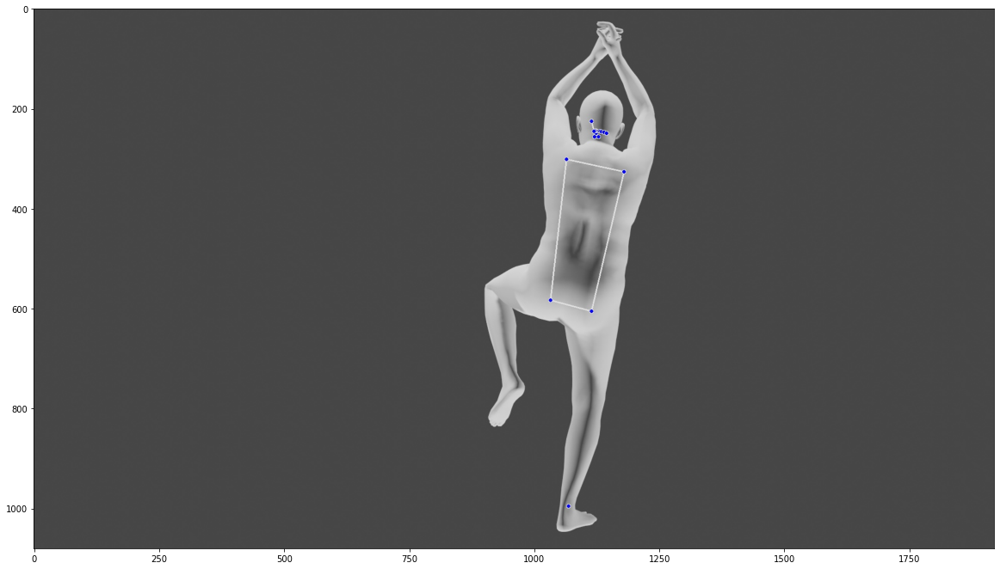

Outlier
  sample path =     D:\videos\yoga\yoga_images_out\yoga_raise\yoga772_cam028_50.jpg
  sample class =    yoga_raise
  detected class =  ['yoga_ready']
  all classes =     {'yoga_stretch_arm': 1, 'yoga_raise': 3, 'yoga_ready': 6}


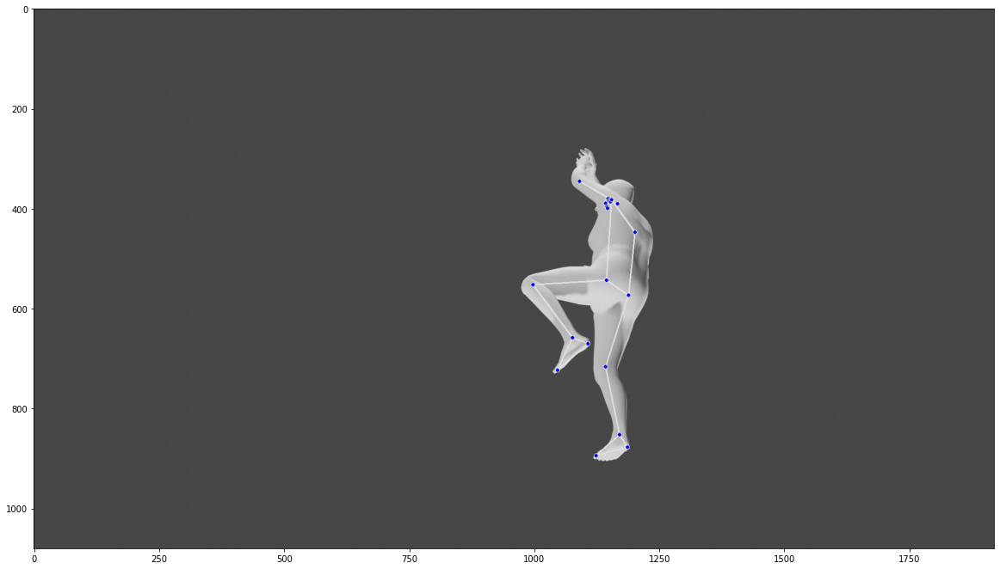

Outlier
  sample path =     D:\videos\yoga\yoga_images_out\yoga_raise\yoga772_cam029_50.jpg
  sample class =    yoga_raise
  detected class =  ['yoga_ready']
  all classes =     {'yoga_raise': 4, 'yoga_ready': 6}


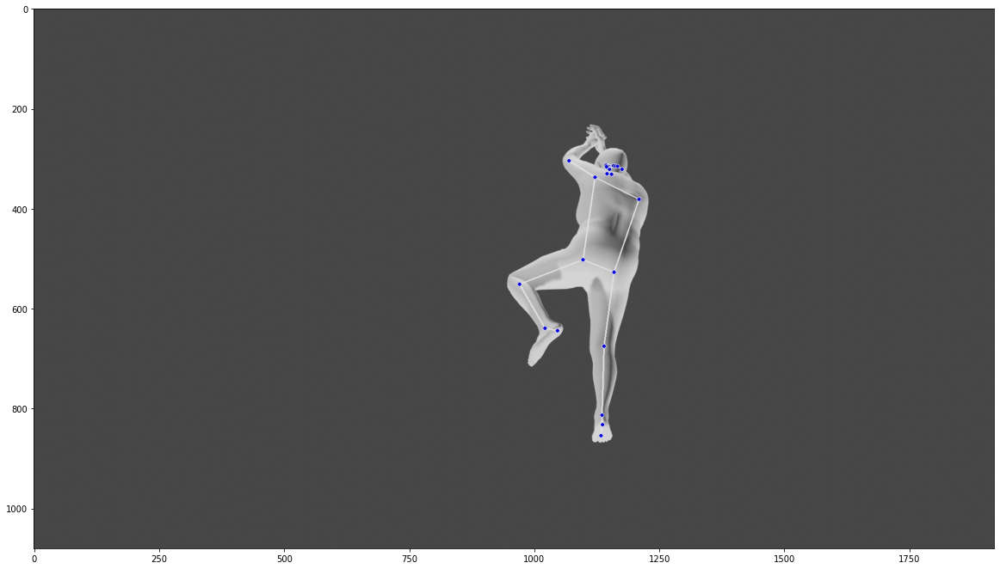

Outlier
  sample path =     D:\videos\yoga\yoga_images_out\yoga_raise\yoga772_cam034_50.jpg
  sample class =    yoga_raise
  detected class =  ['yoga_raise', 'yoga_ready']
  all classes =     {'yoga_stretch_arm': 2, 'yoga_raise': 4, 'yoga_ready': 4}


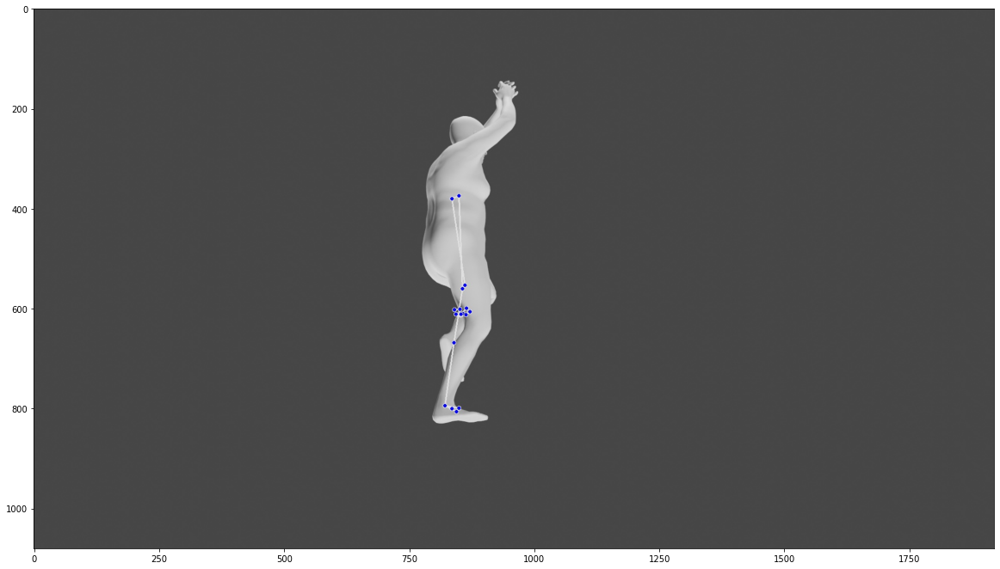

Outlier
  sample path =     D:\videos\yoga\yoga_images_out\yoga_stretch_arm\yoga772_cam034_140.jpg
  sample class =    yoga_stretch_arm
  detected class =  ['yoga_raise']
  all classes =     {'yoga_raise': 9, 'yoga_stretch_arm': 1}


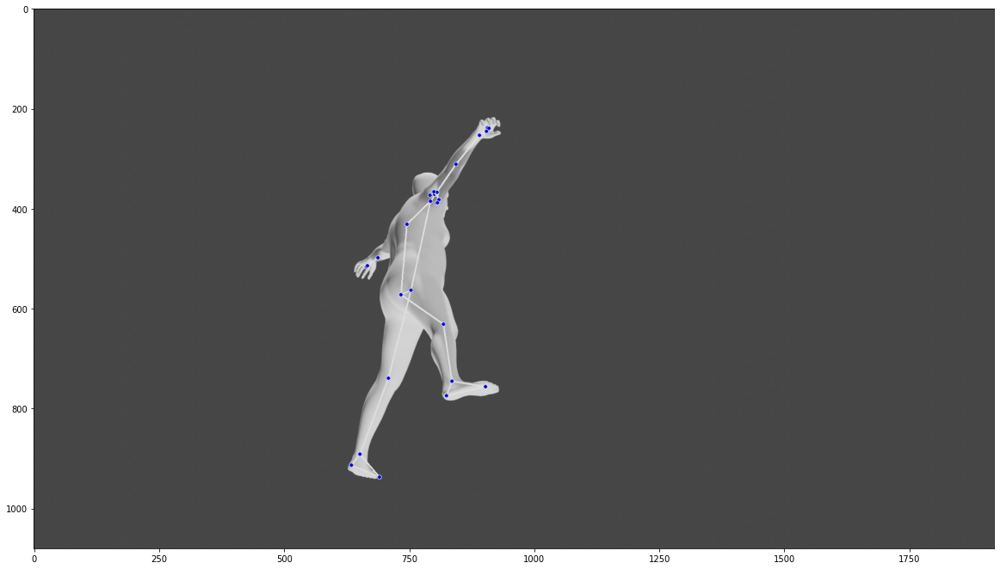

Outlier
  sample path =     D:\videos\yoga\yoga_images_out\yoga_stretch_arm\yoga_stretch_arm_jy20220301_125425.620.jpg
  sample class =    yoga_stretch_arm
  detected class =  ['yoga_ready', 'yoga_stretch_arm']
  all classes =     {'yoga_ready': 5, 'yoga_stretch_arm': 5}


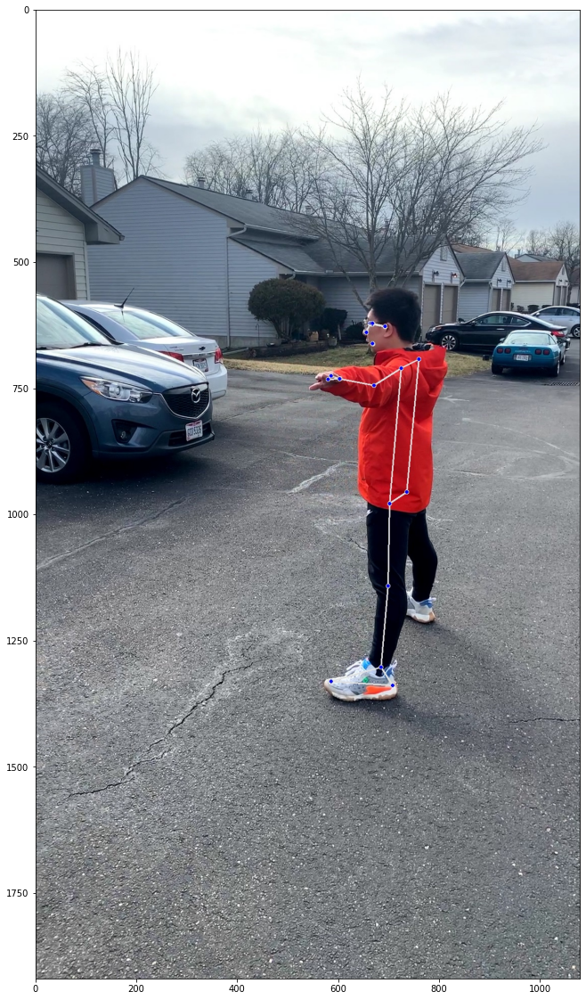

Outlier
  sample path =     D:\videos\yoga\yoga_images_out\yoga_stretch_arm\yoga_stretch_arm_wy20220301_125335.527.jpg
  sample class =    yoga_stretch_arm
  detected class =  ['yoga_ready']
  all classes =     {'yoga_raise': 1, 'yoga_ready': 8, 'yoga_stretch_arm': 1}


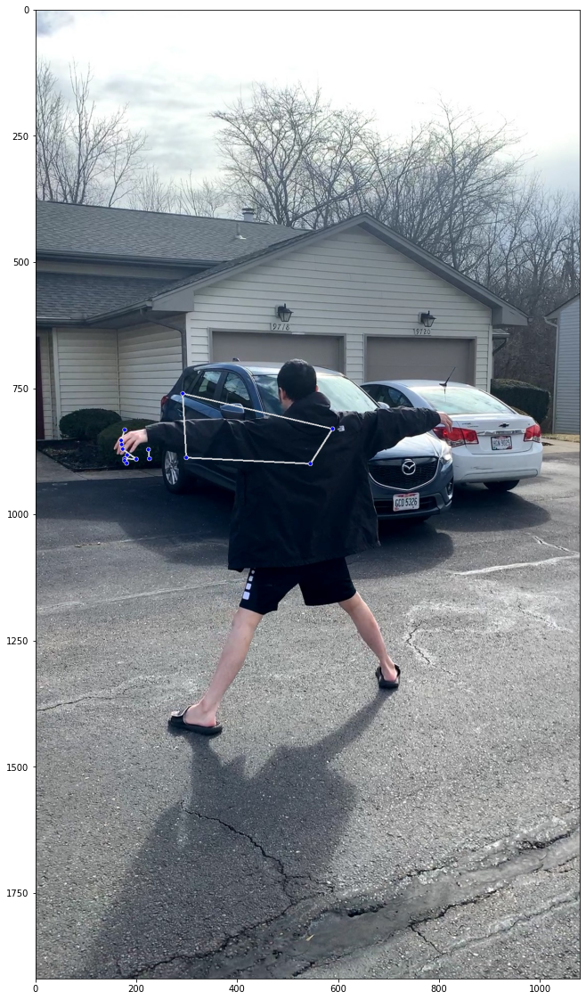

In [20]:
# Analyze outliers.
bootstrap_helper.analyze_outliers(outliers)

In [21]:
# Remove all outliers (if you don't want to manually pick).
bootstrap_helper.remove_outliers(outliers)

In [22]:
# Align CSVs with images after removing outliers.
bootstrap_helper.align_images_and_csvs(print_removed_items=False)
bootstrap_helper.print_images_out_statistics()

Number of images per pose class:
  yoga_raise: 130
  yoga_ready: 111
  yoga_stretch_arm: 130


## Dump for the App

Dump filtered poses to CSV and download it.

Please check this [guide](https://developers.google.com/ml-kit/vision/pose-detection/classifying-poses#4_integrate_with_the_ml_kit_quickstart_app) on how to use this CSV in the ML Kit sample app.

In [23]:
import csv
import os
import numpy as np


def dump_for_the_app():
  pose_samples_folder = r'D:\videos\yoga\yoga_csvs_out'
  pose_samples_csv_path = r'D:\videos\yoga\yoga_csvs_out.csv'
  file_extension = 'csv'
  file_separator = ','

  # Each file in the folder represents one pose class.
  file_names = [name for name in os.listdir(pose_samples_folder) if name.endswith(file_extension)]

  with open(pose_samples_csv_path, 'w') as csv_out:
    csv_out_writer = csv.writer(csv_out, delimiter=file_separator, quoting=csv.QUOTE_MINIMAL)
    for file_name in file_names:
      # Use file name as pose class name.
      class_name = file_name[:-(len(file_extension) + 1)]

      # One file line: `sample_00001,x1,y1,x2,y2,....`.
      with open(os.path.join(pose_samples_folder, file_name)) as csv_in:
        csv_in_reader = csv.reader(csv_in, delimiter=file_separator)
        for row in csv_in_reader:
          row.insert(1, class_name)
          csv_out_writer.writerow(row)

dump_for_the_app()

# Step 2: Classification

**Important!!** Check that you are using the same classification parameters as while building classifier.

In [13]:
# Specify your video name and target pose class to count the repetitions.
video_path = r'D:\videos\yoga\test.mp4'
class_names=['yoga_ready', 'yoga_raise', 'yoga_stretch_arm']
out_video_path = r'D:\videos\yoga\out2.mp4'

In [14]:
# Open the video.
import cv2

video_cap = cv2.VideoCapture(video_path)

# Get some video parameters to generate output video with classificaiton.
video_n_frames = video_cap.get(cv2.CAP_PROP_FRAME_COUNT)
video_fps = video_cap.get(cv2.CAP_PROP_FPS)
video_width = int(video_cap.get(cv2.CAP_PROP_FRAME_WIDTH))
video_height = int(video_cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

In [17]:
# Initilize tracker, classifier and counter.
# Do that before every video as all of them have state.
from mediapipe.python.solutions import pose as mp_pose

class_idx = 0
# Folder with pose class CSVs. That should be the same folder you using while
# building classifier to output CSVs.
pose_samples_folder = r'D:\videos\yoga\yoga_csvs_out'

# Initialize tracker.
pose_tracker = mp_pose.Pose(model_complexity=2,
                    min_detection_confidence=0.5,
                    min_tracking_confidence=0.5)

# Initialize embedder.
pose_embedder = FullBodyPoseEmbedder()

# Initialize classifier.
# Check that you are using the same parameters as during bootstrapping.
pose_classifier = PoseClassifier(
    pose_samples_folder=pose_samples_folder,
    pose_embedder=pose_embedder,
    top_n_by_max_distance=30,
    top_n_by_mean_distance=10)

# # Uncomment to validate target poses used by classifier and find outliers.
# outliers = pose_classifier.find_pose_sample_outliers()
# print('Number of pose sample outliers (consider removing them): ', len(outliers))

# Initialize EMA smoothing.
pose_classification_filter = EMADictSmoothing(
    window_size=10,
    alpha=0.2)

# Initialize counter.
# repetition_counter = RepetitionCounter(
#     class_name=class_name,
#     enter_threshold=8,
#     exit_threshold=6)

pose_checker = PoseChecker(
    class_name=class_names[class_idx],
    enter_threshold=8,
    exit_threshold=6
)

# Initialize renderer.
pose_classification_visualizer = PoseClassificationVisualizer(
    class_name=class_names[class_idx],
    plot_x_max=video_n_frames,
    # Graphic looks nicer if it's the same as `top_n_by_mean_distance`.
    plot_y_max=10)

  0%|          | 0/1520.0 [00:00<?, ?it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


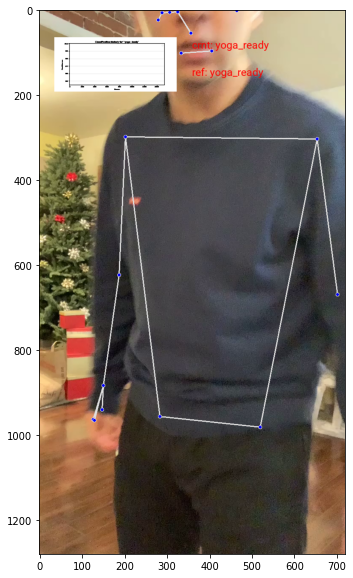

  0%|          | 1/1520.0 [00:01<34:00,  1.34s/it]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  0%|          | 2/1520.0 [00:01<20:00,  1.26it/s]

start time 1646844487.000562


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  0%|          | 3/1520.0 [00:01<13:13,  1.91it/s]

start time 1646844487.2635612
start time 1646844487.453594


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  0%|          | 4/1520.0 [00:02<09:59,  2.53it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  0%|          | 5/1520.0 [00:02<08:22,  3.02it/s]

start time 1646844487.6805608
start time 1646844487.8765633


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  0%|          | 6/1520.0 [00:02<07:12,  3.50it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  0%|          | 7/1520.0 [00:02<06:25,  3.92it/s]

start time 1646844488.0705934
start time 1646844488.2595818


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  1%|          | 8/1520.0 [00:02<05:51,  4.30it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  1%|          | 9/1520.0 [00:03<05:24,  4.66it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844488.437561
start time 1646844488.613562


  1%|          | 10/1520.0 [00:03<05:06,  4.93it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  1%|          | 11/1520.0 [00:03<04:48,  5.22it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844488.7815611
start time 1646844488.9635608


  1%|          | 12/1520.0 [00:03<04:45,  5.28it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  1%|          | 13/1520.0 [00:03<04:37,  5.43it/s]

start time 1646844489.1385605
start time 1646844489.3115616


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  1%|          | 14/1520.0 [00:03<04:34,  5.48it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  1%|          | 15/1520.0 [00:04<05:09,  4.87it/s]

start time 1646844489.482592


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  1%|          | 16/1520.0 [00:04<04:52,  5.13it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844489.7465925
start time 1646844489.917591


  1%|          | 17/1520.0 [00:04<04:42,  5.33it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  1%|          | 18/1520.0 [00:04<04:33,  5.48it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844490.0855913
start time 1646844490.2525914


  1%|▏         | 19/1520.0 [00:04<04:27,  5.62it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  1%|▏         | 20/1520.0 [00:05<04:27,  5.61it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844490.4315908
start time 1646844490.5995932


  1%|▏         | 21/1520.0 [00:05<04:21,  5.73it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  1%|▏         | 22/1520.0 [00:05<04:17,  5.81it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844490.765592
start time 1646844490.9335914


  2%|▏         | 23/1520.0 [00:05<04:16,  5.84it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  2%|▏         | 24/1520.0 [00:05<04:14,  5.88it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844491.101592
start time 1646844491.2675605


  2%|▏         | 25/1520.0 [00:05<04:11,  5.94it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  2%|▏         | 26/1520.0 [00:06<04:13,  5.89it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844491.430561
start time 1646844491.6065912


  2%|▏         | 27/1520.0 [00:06<04:11,  5.93it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  2%|▏         | 28/1520.0 [00:06<04:09,  5.99it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844491.7685916
start time 1646844491.9395916


  2%|▏         | 29/1520.0 [00:06<04:10,  5.95it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  2%|▏         | 30/1520.0 [00:06<04:09,  5.97it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844492.1045916
start time 1646844492.270593


  2%|▏         | 31/1520.0 [00:06<04:10,  5.94it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  2%|▏         | 32/1520.0 [00:07<05:10,  4.80it/s]

start time 1646844492.4615605


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  2%|▏         | 33/1520.0 [00:07<05:10,  4.79it/s]

start time 1646844492.7755618


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  2%|▏         | 34/1520.0 [00:07<05:56,  4.16it/s]

start time 1646844493.007563


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  2%|▏         | 35/1520.0 [00:08<06:49,  3.63it/s]

start time 1646844493.4095628


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  2%|▏         | 36/1520.0 [00:08<06:23,  3.87it/s]

start time 1646844493.6635966


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  2%|▏         | 37/1520.0 [00:08<06:04,  4.07it/s]

start time 1646844493.875562


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  2%|▎         | 38/1520.0 [00:08<06:02,  4.08it/s]

start time 1646844494.1175632


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  3%|▎         | 39/1520.0 [00:09<05:45,  4.29it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  3%|▎         | 40/1520.0 [00:09<05:21,  4.60it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844494.3265636
start time 1646844494.5225952
start time 1646844494.6885622


  3%|▎         | 41/1520.0 [00:09<05:00,  4.92it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  3%|▎         | 42/1520.0 [00:09<04:48,  5.12it/s]

start time 1646844494.8685918
start time 1646844495.0465922


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  3%|▎         | 43/1520.0 [00:09<04:40,  5.27it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  3%|▎         | 44/1520.0 [00:09<04:32,  5.41it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844495.2165616
start time 1646844495.3875983


  3%|▎         | 45/1520.0 [00:10<04:25,  5.56it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  3%|▎         | 46/1520.0 [00:10<04:18,  5.69it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844495.5545926
start time 1646844495.7215917


  3%|▎         | 47/1520.0 [00:10<04:16,  5.75it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  3%|▎         | 48/1520.0 [00:10<04:20,  5.64it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844495.9075615
start time 1646844496.0745628


  3%|▎         | 49/1520.0 [00:10<04:15,  5.76it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  3%|▎         | 50/1520.0 [00:10<04:11,  5.85it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844496.2385917
start time 1646844496.4005919


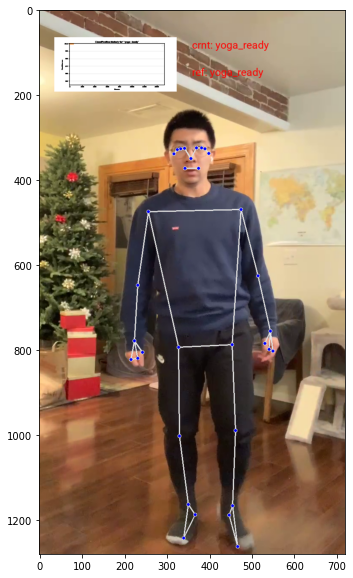

  3%|▎         | 51/1520.0 [00:11<05:52,  4.17it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  3%|▎         | 52/1520.0 [00:11<05:20,  4.58it/s]

start time 1646844496.8055913
start time 1646844496.9875607


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  3%|▎         | 53/1520.0 [00:11<06:00,  4.07it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  4%|▎         | 54/1520.0 [00:11<05:30,  4.43it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844497.2955909
start time 1646844497.4585943


  4%|▎         | 55/1520.0 [00:12<05:02,  4.84it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  4%|▎         | 56/1520.0 [00:12<04:44,  5.15it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844497.623592
start time 1646844497.7855918


  4%|▍         | 57/1520.0 [00:12<04:30,  5.41it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  4%|▍         | 58/1520.0 [00:12<04:25,  5.50it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844497.957561
start time 1646844498.1285925


  4%|▍         | 59/1520.0 [00:12<04:19,  5.64it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  4%|▍         | 60/1520.0 [00:12<04:12,  5.79it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844498.2925937
start time 1646844498.4535913


  4%|▍         | 61/1520.0 [00:13<04:08,  5.88it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  4%|▍         | 62/1520.0 [00:13<04:07,  5.89it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844498.6195927
start time 1646844498.7935941


  4%|▍         | 63/1520.0 [00:13<04:07,  5.89it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  4%|▍         | 64/1520.0 [00:13<04:05,  5.94it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844498.9585922
start time 1646844499.1355922


  4%|▍         | 65/1520.0 [00:13<04:09,  5.83it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  4%|▍         | 66/1520.0 [00:13<04:07,  5.88it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844499.303592
start time 1646844499.4696207


  4%|▍         | 67/1520.0 [00:14<04:05,  5.92it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  4%|▍         | 68/1520.0 [00:14<04:39,  5.20it/s]

start time 1646844499.6445923


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  5%|▍         | 69/1520.0 [00:14<04:30,  5.36it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844499.889591
start time 1646844500.055621


  5%|▍         | 70/1520.0 [00:14<04:21,  5.55it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  5%|▍         | 71/1520.0 [00:14<04:20,  5.55it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844500.2336206
start time 1646844500.400623


  5%|▍         | 72/1520.0 [00:15<04:15,  5.67it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  5%|▍         | 73/1520.0 [00:15<04:12,  5.73it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844500.5705922
start time 1646844500.7386227


  5%|▍         | 74/1520.0 [00:15<04:07,  5.84it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  5%|▍         | 75/1520.0 [00:15<04:07,  5.83it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844500.9085913
start time 1646844501.0746233


  5%|▌         | 76/1520.0 [00:15<04:04,  5.91it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  5%|▌         | 77/1520.0 [00:15<04:04,  5.90it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844501.2396233
start time 1646844501.4075902


  5%|▌         | 78/1520.0 [00:16<04:01,  5.98it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  5%|▌         | 79/1520.0 [00:16<04:04,  5.89it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844501.5696204
start time 1646844501.7415926


  5%|▌         | 80/1520.0 [00:16<03:59,  6.01it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  5%|▌         | 81/1520.0 [00:16<03:59,  6.02it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844501.9066207
start time 1646844502.0676198


  5%|▌         | 82/1520.0 [00:16<03:55,  6.10it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  5%|▌         | 83/1520.0 [00:16<03:57,  6.06it/s]

start time 1646844502.2286217
start time 1646844502.4075916


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  6%|▌         | 84/1520.0 [00:17<04:02,  5.93it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  6%|▌         | 85/1520.0 [00:17<04:07,  5.80it/s]

start time 1646844502.5716
start time 1646844502.8605912


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  6%|▌         | 86/1520.0 [00:17<06:29,  3.68it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  6%|▌         | 87/1520.0 [00:17<05:55,  4.03it/s]

start time 1646844503.274591
start time 1646844503.476591


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  6%|▌         | 88/1520.0 [00:18<05:37,  4.24it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  6%|▌         | 89/1520.0 [00:18<05:13,  4.56it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844503.67159
start time 1646844503.8366225


  6%|▌         | 90/1520.0 [00:18<04:48,  4.95it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  6%|▌         | 91/1520.0 [00:18<04:33,  5.23it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844503.999621
start time 1646844504.166621


  6%|▌         | 92/1520.0 [00:18<04:21,  5.46it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  6%|▌         | 93/1520.0 [00:19<04:15,  5.59it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844504.3346212
start time 1646844504.5106475


  6%|▌         | 94/1520.0 [00:19<04:14,  5.60it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  6%|▋         | 95/1520.0 [00:19<04:08,  5.74it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844504.6776216
start time 1646844504.840591


  6%|▋         | 96/1520.0 [00:19<04:06,  5.78it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  6%|▋         | 97/1520.0 [00:19<04:08,  5.73it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844505.0256207
start time 1646844505.1886215


  6%|▋         | 98/1520.0 [00:19<04:03,  5.84it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  7%|▋         | 99/1520.0 [00:20<04:01,  5.89it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844505.3546216
start time 1646844505.5206203


  7%|▋         | 100/1520.0 [00:20<04:01,  5.87it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844505.6966205


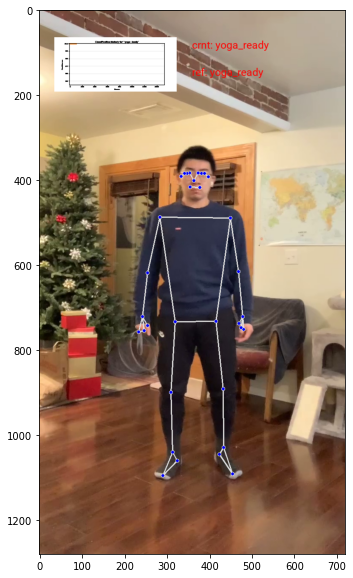

  7%|▋         | 101/1520.0 [00:20<05:44,  4.12it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  7%|▋         | 102/1520.0 [00:20<05:11,  4.55it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844506.1056206
start time 1646844506.2686207


  7%|▋         | 103/1520.0 [00:20<04:48,  4.92it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  7%|▋         | 104/1520.0 [00:21<04:32,  5.20it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844506.4356236
start time 1646844506.5976205


  7%|▋         | 105/1520.0 [00:21<04:20,  5.44it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  7%|▋         | 106/1520.0 [00:21<04:13,  5.57it/s]

start time 1646844506.7706215
start time 1646844506.9405901


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  7%|▋         | 107/1520.0 [00:21<05:10,  4.55it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  7%|▋         | 108/1520.0 [00:21<04:45,  4.95it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844507.2426217
start time 1646844507.41959


  7%|▋         | 109/1520.0 [00:22<04:34,  5.14it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  7%|▋         | 110/1520.0 [00:22<04:27,  5.28it/s]

start time 1646844507.5846279
start time 1646844507.7705908


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  7%|▋         | 111/1520.0 [00:22<04:20,  5.40it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  7%|▋         | 112/1520.0 [00:22<04:16,  5.49it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844507.9456213
start time 1646844508.1096225


  7%|▋         | 113/1520.0 [00:22<04:07,  5.69it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  8%|▊         | 114/1520.0 [00:22<04:02,  5.81it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844508.2726219
start time 1646844508.43662


  8%|▊         | 115/1520.0 [00:23<03:58,  5.89it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  8%|▊         | 116/1520.0 [00:23<03:55,  5.96it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844508.6026216
start time 1646844508.7735915


  8%|▊         | 117/1520.0 [00:23<04:03,  5.76it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  8%|▊         | 118/1520.0 [00:23<04:08,  5.63it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844508.97359
start time 1646844509.1405902


  8%|▊         | 119/1520.0 [00:23<04:03,  5.75it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  8%|▊         | 120/1520.0 [00:23<03:59,  5.85it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844509.3046212
start time 1646844509.4696326


  8%|▊         | 121/1520.0 [00:24<03:57,  5.88it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  8%|▊         | 122/1520.0 [00:24<03:58,  5.87it/s]

start time 1646844509.6396208
start time 1646844509.8046207


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  8%|▊         | 123/1520.0 [00:24<04:30,  5.17it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  8%|▊         | 124/1520.0 [00:24<04:18,  5.40it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844510.0586214
start time 1646844510.2236319


  8%|▊         | 125/1520.0 [00:24<04:11,  5.56it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  8%|▊         | 126/1520.0 [00:25<04:04,  5.70it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844510.3886209
start time 1646844510.5556214


  8%|▊         | 127/1520.0 [00:25<04:00,  5.78it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  8%|▊         | 128/1520.0 [00:25<03:59,  5.82it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844510.7236133
start time 1646844510.891592


  8%|▊         | 129/1520.0 [00:25<03:57,  5.85it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  9%|▊         | 130/1520.0 [00:25<03:59,  5.81it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844511.0706208
start time 1646844511.2306206


  9%|▊         | 131/1520.0 [00:25<03:54,  5.92it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  9%|▊         | 132/1520.0 [00:26<03:52,  5.98it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844511.3956208
start time 1646844511.5575924


  9%|▉         | 133/1520.0 [00:26<03:51,  5.98it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  9%|▉         | 134/1520.0 [00:26<03:49,  6.04it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844511.7236314
start time 1646844511.8905907


  9%|▉         | 135/1520.0 [00:26<03:50,  6.00it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  9%|▉         | 136/1520.0 [00:26<03:50,  6.01it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844512.0545897
start time 1646844512.2216213


  9%|▉         | 137/1520.0 [00:26<03:48,  6.04it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  9%|▉         | 138/1520.0 [00:27<03:48,  6.06it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844512.3836215
start time 1646844512.5485919


  9%|▉         | 139/1520.0 [00:27<03:47,  6.07it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  9%|▉         | 140/1520.0 [00:27<03:45,  6.11it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844512.7096226
start time 1646844512.8756216


  9%|▉         | 141/1520.0 [00:27<03:49,  6.02it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  9%|▉         | 142/1520.0 [00:27<04:33,  5.04it/s]

start time 1646844513.0566213


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  9%|▉         | 143/1520.0 [00:28<04:21,  5.26it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844513.325621
start time 1646844513.4886208


  9%|▉         | 144/1520.0 [00:28<04:09,  5.51it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 10%|▉         | 145/1520.0 [00:28<04:02,  5.67it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844513.650621
start time 1646844513.8145897


 10%|▉         | 146/1520.0 [00:28<03:55,  5.83it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 10%|▉         | 147/1520.0 [00:28<03:52,  5.89it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844513.9755905
start time 1646844514.1415923


 10%|▉         | 148/1520.0 [00:28<03:50,  5.94it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 10%|▉         | 149/1520.0 [00:28<03:53,  5.86it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844514.318621
start time 1646844514.4846208


 10%|▉         | 150/1520.0 [00:29<03:52,  5.89it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844514.6576023


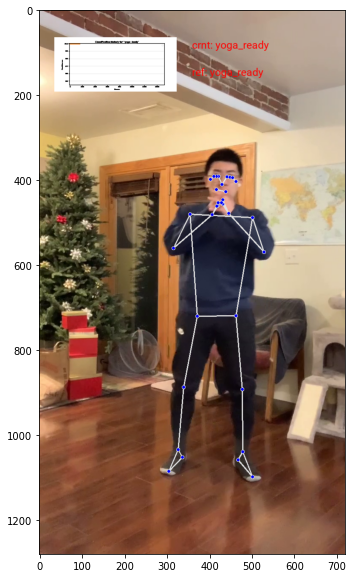

 10%|▉         | 151/1520.0 [00:29<06:02,  3.78it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 10%|█         | 152/1520.0 [00:29<06:27,  3.53it/s]

start time 1646844515.2705917
start time 1646844515.4746222


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 10%|█         | 153/1520.0 [00:30<05:47,  3.94it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 10%|█         | 154/1520.0 [00:30<05:24,  4.21it/s]

start time 1646844515.6636217


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 10%|█         | 155/1520.0 [00:30<05:13,  4.35it/s]

start time 1646844515.8875914
start time 1646844516.0676222


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 10%|█         | 156/1520.0 [00:30<04:49,  4.70it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 10%|█         | 157/1520.0 [00:30<04:33,  4.97it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844516.2396207
start time 1646844516.408593


 10%|█         | 158/1520.0 [00:31<04:21,  5.22it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 10%|█         | 159/1520.0 [00:31<04:10,  5.43it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844516.5776234
start time 1646844516.7405927


 11%|█         | 160/1520.0 [00:31<04:00,  5.66it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 11%|█         | 161/1520.0 [00:31<03:58,  5.69it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844516.9066215
start time 1646844517.0746217


 11%|█         | 162/1520.0 [00:31<03:54,  5.79it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 11%|█         | 163/1520.0 [00:31<03:51,  5.86it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844517.2425904
start time 1646844517.4105916


 11%|█         | 164/1520.0 [00:32<03:52,  5.82it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 11%|█         | 165/1520.0 [00:32<04:52,  4.63it/s]

start time 1646844517.592626


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 11%|█         | 166/1520.0 [00:32<04:33,  4.96it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844517.9066224
start time 1646844518.0675905


 11%|█         | 167/1520.0 [00:32<04:17,  5.25it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 11%|█         | 168/1520.0 [00:32<04:05,  5.50it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844518.233621
start time 1646844518.3946214


 11%|█         | 169/1520.0 [00:33<03:58,  5.66it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 11%|█         | 170/1520.0 [00:33<03:58,  5.67it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844518.5615895
start time 1646844518.739623


 11%|█▏        | 171/1520.0 [00:33<03:54,  5.76it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 11%|█▏        | 172/1520.0 [00:33<03:58,  5.66it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844518.9216213
start time 1646844519.088621


 11%|█▏        | 173/1520.0 [00:33<03:54,  5.74it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 11%|█▏        | 174/1520.0 [00:33<03:50,  5.84it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844519.256622
start time 1646844519.421621


 12%|█▏        | 175/1520.0 [00:34<03:49,  5.87it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 12%|█▏        | 176/1520.0 [00:34<03:48,  5.89it/s]

start time 1646844519.5896194
start time 1646844519.7726197


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 12%|█▏        | 177/1520.0 [00:34<03:55,  5.71it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 12%|█▏        | 178/1520.0 [00:34<03:55,  5.70it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844519.9556234
start time 1646844520.1206205


 12%|█▏        | 179/1520.0 [00:34<03:51,  5.79it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 12%|█▏        | 180/1520.0 [00:34<03:49,  5.85it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844520.2866206
start time 1646844520.4566221


 12%|█▏        | 181/1520.0 [00:35<03:48,  5.87it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 12%|█▏        | 182/1520.0 [00:35<04:19,  5.16it/s]

start time 1646844520.6206229


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 12%|█▏        | 183/1520.0 [00:35<04:19,  5.16it/s]

start time 1646844520.8896215
start time 1646844521.0676205


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 12%|█▏        | 184/1520.0 [00:35<04:08,  5.38it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 12%|█▏        | 185/1520.0 [00:35<03:58,  5.61it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844521.2296195
start time 1646844521.3896205


 12%|█▏        | 186/1520.0 [00:36<03:51,  5.77it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 12%|█▏        | 187/1520.0 [00:36<03:48,  5.84it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844521.5546207
start time 1646844521.7215903


 12%|█▏        | 188/1520.0 [00:36<03:46,  5.88it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 12%|█▏        | 189/1520.0 [00:36<03:50,  5.76it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844521.9045942
start time 1646844522.0676234


 12%|█▎        | 190/1520.0 [00:36<03:47,  5.86it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 13%|█▎        | 191/1520.0 [00:36<03:42,  5.96it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844522.2326217
start time 1646844522.3905923


 13%|█▎        | 192/1520.0 [00:37<03:40,  6.02it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 13%|█▎        | 193/1520.0 [00:37<03:38,  6.07it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844522.552621
start time 1646844522.7165902


 13%|█▎        | 194/1520.0 [00:37<03:37,  6.11it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 13%|█▎        | 195/1520.0 [00:37<03:45,  5.88it/s]

start time 1646844522.886622
start time 1646844523.0716207


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 13%|█▎        | 196/1520.0 [00:37<03:47,  5.81it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 13%|█▎        | 197/1520.0 [00:37<03:44,  5.90it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844523.2396214
start time 1646844523.4036644


 13%|█▎        | 198/1520.0 [00:38<03:42,  5.95it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 13%|█▎        | 199/1520.0 [00:38<03:40,  5.98it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844523.5706995
start time 1646844523.7336955


 13%|█▎        | 200/1520.0 [00:38<03:40,  5.99it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844523.9066644


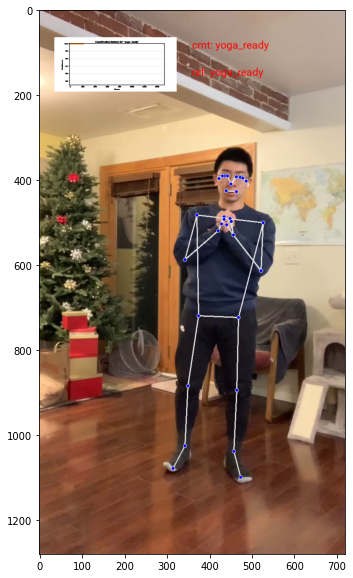

 13%|█▎        | 201/1520.0 [00:38<05:18,  4.14it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 13%|█▎        | 202/1520.0 [00:38<04:48,  4.56it/s]

start time 1646844524.3206964
start time 1646844524.4846995


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 13%|█▎        | 203/1520.0 [00:39<05:21,  4.09it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 13%|█▎        | 204/1520.0 [00:39<04:50,  4.53it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844524.7866962
start time 1646844524.9626966


 13%|█▎        | 205/1520.0 [00:39<04:33,  4.80it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 14%|█▎        | 206/1520.0 [00:39<04:20,  5.04it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844525.1416657
start time 1646844525.3066642


 14%|█▎        | 207/1520.0 [00:39<04:07,  5.31it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 14%|█▎        | 208/1520.0 [00:40<04:00,  5.46it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844525.4746652
start time 1646844525.6506953


 14%|█▍        | 209/1520.0 [00:40<03:55,  5.57it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 14%|█▍        | 210/1520.0 [00:40<03:52,  5.64it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844525.8196642
start time 1646844525.9896948


 14%|█▍        | 211/1520.0 [00:40<03:49,  5.69it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 14%|█▍        | 212/1520.0 [00:40<03:48,  5.72it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844526.1566665
start time 1646844526.3326945


 14%|█▍        | 213/1520.0 [00:41<03:46,  5.78it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 14%|█▍        | 214/1520.0 [00:41<03:42,  5.87it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844526.499695
start time 1646844526.6606948


 14%|█▍        | 215/1520.0 [00:41<03:39,  5.94it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 14%|█▍        | 216/1520.0 [00:41<03:39,  5.94it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844526.8286645
start time 1646844526.9936953


 14%|█▍        | 217/1520.0 [00:41<03:37,  5.99it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 14%|█▍        | 218/1520.0 [00:41<04:05,  5.29it/s]

start time 1646844527.163695


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 14%|█▍        | 219/1520.0 [00:42<03:59,  5.44it/s]

start time 1646844527.4046643
start time 1646844527.581696


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 14%|█▍        | 220/1520.0 [00:42<03:55,  5.51it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 15%|█▍        | 221/1520.0 [00:42<04:56,  4.38it/s]

start time 1646844527.8346653


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 15%|█▍        | 222/1520.0 [00:42<05:09,  4.19it/s]

start time 1646844528.1766648
start time 1646844528.364697


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 15%|█▍        | 223/1520.0 [00:43<04:51,  4.45it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 15%|█▍        | 224/1520.0 [00:43<04:42,  4.59it/s]

start time 1646844528.5636942
start time 1646844528.753695


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 15%|█▍        | 225/1520.0 [00:43<04:26,  4.86it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 15%|█▍        | 226/1520.0 [00:43<04:20,  4.97it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844528.9356964
start time 1646844529.1086648


 15%|█▍        | 227/1520.0 [00:43<04:06,  5.25it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 15%|█▌        | 228/1520.0 [00:43<03:55,  5.49it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844529.2746654
start time 1646844529.440665


 15%|█▌        | 229/1520.0 [00:44<03:50,  5.60it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 15%|█▌        | 230/1520.0 [00:44<03:44,  5.74it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844529.6086643
start time 1646844529.771697


 15%|█▌        | 231/1520.0 [00:44<03:44,  5.75it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 15%|█▌        | 232/1520.0 [00:44<03:49,  5.62it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844529.966695
start time 1646844530.133696


 15%|█▌        | 233/1520.0 [00:44<03:44,  5.73it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 15%|█▌        | 234/1520.0 [00:44<03:41,  5.81it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844530.3016937
start time 1646844530.4676948


 15%|█▌        | 235/1520.0 [00:45<03:40,  5.84it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 16%|█▌        | 236/1520.0 [00:45<04:12,  5.08it/s]

start time 1646844530.6446984


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 16%|█▌        | 237/1520.0 [00:45<04:04,  5.24it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844530.9026947
start time 1646844531.0686655


 16%|█▌        | 238/1520.0 [00:45<03:54,  5.47it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 16%|█▌        | 239/1520.0 [00:45<03:46,  5.65it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844531.2316947
start time 1646844531.392689


 16%|█▌        | 240/1520.0 [00:46<03:40,  5.81it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 16%|█▌        | 241/1520.0 [00:46<03:40,  5.80it/s]

start time 1646844531.5556638
start time 1646844531.734665


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 16%|█▌        | 242/1520.0 [00:46<03:40,  5.80it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 16%|█▌        | 243/1520.0 [00:46<03:39,  5.82it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844531.9056644
start time 1646844532.0716643


 16%|█▌        | 244/1520.0 [00:46<03:35,  5.91it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 16%|█▌        | 245/1520.0 [00:46<03:33,  5.97it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844532.235664
start time 1646844532.3986645


 16%|█▌        | 246/1520.0 [00:47<03:31,  6.02it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 16%|█▋        | 247/1520.0 [00:47<03:29,  6.06it/s]

start time 1646844532.560696
start time 1646844532.7336648


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 16%|█▋        | 248/1520.0 [00:47<03:34,  5.94it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 16%|█▋        | 249/1520.0 [00:47<03:37,  5.84it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844532.9066644
start time 1646844533.0846937


 16%|█▋        | 250/1520.0 [00:47<03:36,  5.85it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844533.2486966


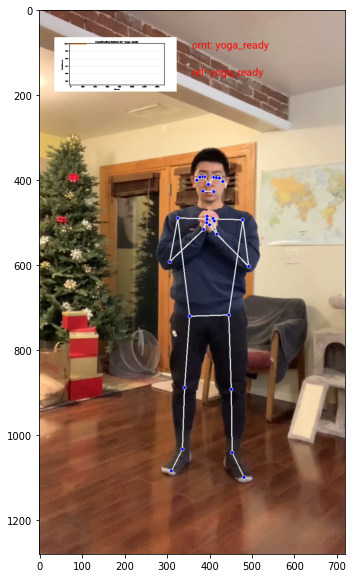

 17%|█▋        | 251/1520.0 [00:48<05:06,  4.14it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 17%|█▋        | 252/1520.0 [00:48<04:36,  4.59it/s]

start time 1646844533.6546645
start time 1646844533.8276956


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 17%|█▋        | 253/1520.0 [00:48<04:21,  4.84it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 17%|█▋        | 254/1520.0 [00:48<04:06,  5.14it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844533.999694
start time 1646844534.1636992


 17%|█▋        | 255/1520.0 [00:48<03:55,  5.37it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 17%|█▋        | 256/1520.0 [00:49<03:48,  5.54it/s]

start time 1646844534.3326948
start time 1646844534.4966955


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 17%|█▋        | 257/1520.0 [00:49<04:34,  4.59it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 17%|█▋        | 258/1520.0 [00:49<04:17,  4.90it/s]

start time 1646844534.8046644
start time 1646844534.9876952


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 17%|█▋        | 259/1520.0 [00:49<04:08,  5.08it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 17%|█▋        | 260/1520.0 [00:49<03:56,  5.33it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844535.1576672
start time 1646844535.3216946


 17%|█▋        | 261/1520.0 [00:50<03:48,  5.51it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 17%|█▋        | 262/1520.0 [00:50<03:42,  5.66it/s]

start time 1646844535.4896643


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 17%|█▋        | 263/1520.0 [00:50<04:19,  4.84it/s]

start time 1646844535.7256658


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 17%|█▋        | 264/1520.0 [00:50<05:03,  4.14it/s]

start time 1646844536.0776658
start time 1646844536.2636974


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 17%|█▋        | 265/1520.0 [00:50<04:42,  4.45it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 18%|█▊        | 266/1520.0 [00:51<04:37,  4.51it/s]

start time 1646844536.4786644
start time 1646844536.6556957


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 18%|█▊        | 267/1520.0 [00:51<04:18,  4.85it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 18%|█▊        | 268/1520.0 [00:51<04:02,  5.17it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844536.8216646
start time 1646844536.9896646


 18%|█▊        | 269/1520.0 [00:51<03:52,  5.38it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 18%|█▊        | 270/1520.0 [00:51<03:53,  5.36it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844537.1766958
start time 1646844537.3396647


 18%|█▊        | 271/1520.0 [00:52<03:43,  5.58it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 18%|█▊        | 272/1520.0 [00:52<03:37,  5.75it/s]

start time 1646844537.5026953
start time 1646844537.6756954


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 18%|█▊        | 273/1520.0 [00:52<04:05,  5.08it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 18%|█▊        | 274/1520.0 [00:52<03:56,  5.27it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844537.9256978
start time 1646844538.0877016


 18%|█▊        | 275/1520.0 [00:52<03:46,  5.50it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 18%|█▊        | 276/1520.0 [00:52<03:43,  5.57it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844538.2646954
start time 1646844538.4266644


 18%|█▊        | 277/1520.0 [00:53<03:37,  5.73it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 18%|█▊        | 278/1520.0 [00:53<03:36,  5.74it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844538.5956957
start time 1646844538.7646646


 18%|█▊        | 279/1520.0 [00:53<03:32,  5.83it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 18%|█▊        | 280/1520.0 [00:53<03:35,  5.76it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844538.9416668
start time 1646844539.119664


 18%|█▊        | 281/1520.0 [00:53<03:37,  5.70it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 19%|█▊        | 282/1520.0 [00:53<03:40,  5.60it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844539.3006647
start time 1646844539.4746659


 19%|█▊        | 283/1520.0 [00:54<03:36,  5.72it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 19%|█▊        | 284/1520.0 [00:54<03:32,  5.81it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844539.6386967
start time 1646844539.8056948


 19%|█▉        | 285/1520.0 [00:54<03:31,  5.84it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 19%|█▉        | 286/1520.0 [00:54<03:32,  5.80it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844539.9766645
start time 1646844540.1526966


 19%|█▉        | 287/1520.0 [00:54<03:31,  5.83it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 19%|█▉        | 288/1520.0 [00:55<03:35,  5.72it/s]

start time 1646844540.3226933
start time 1646844540.505664


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 19%|█▉        | 289/1520.0 [00:55<03:34,  5.73it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 19%|█▉        | 290/1520.0 [00:55<03:32,  5.78it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844540.6746674
start time 1646844540.844664


 19%|█▉        | 291/1520.0 [00:55<03:29,  5.85it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 19%|█▉        | 292/1520.0 [00:55<04:06,  4.98it/s]

start time 1646844541.0226648


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 19%|█▉        | 293/1520.0 [00:55<03:56,  5.19it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844541.2876937
start time 1646844541.454665


 19%|█▉        | 294/1520.0 [00:56<04:03,  5.04it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 19%|█▉        | 295/1520.0 [00:56<04:58,  4.10it/s]

start time 1646844541.8296673
start time 1646844542.0386655


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 19%|█▉        | 296/1520.0 [00:56<04:41,  4.35it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 20%|█▉        | 297/1520.0 [00:56<04:27,  4.58it/s]

start time 1646844542.228697


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 20%|█▉        | 298/1520.0 [00:57<04:25,  4.61it/s]

start time 1646844542.4416668
start time 1646844542.6326969


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 20%|█▉        | 299/1520.0 [00:57<04:12,  4.83it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 20%|█▉        | 300/1520.0 [00:57<04:02,  5.04it/s]

start time 1646844542.8066652
start time 1646844542.9846952


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


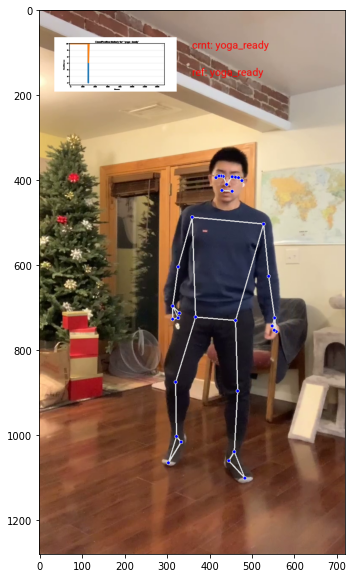

 20%|█▉        | 301/1520.0 [00:57<05:20,  3.81it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 20%|█▉        | 302/1520.0 [00:58<04:45,  4.27it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844543.3956964
start time 1646844543.557666


 20%|█▉        | 303/1520.0 [00:58<04:18,  4.70it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 20%|██        | 304/1520.0 [00:58<04:05,  4.95it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844543.7336948
start time 1646844543.9016645


 20%|██        | 305/1520.0 [00:58<03:52,  5.22it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 20%|██        | 306/1520.0 [00:58<03:44,  5.41it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844544.0686953
start time 1646844544.235666


 20%|██        | 307/1520.0 [00:58<03:38,  5.56it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 20%|██        | 308/1520.0 [00:59<03:33,  5.67it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844544.4066646
start time 1646844544.5716958


 20%|██        | 309/1520.0 [00:59<03:29,  5.79it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 20%|██        | 310/1520.0 [00:59<03:32,  5.71it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844544.7496665
start time 1646844544.9226935


 20%|██        | 311/1520.0 [00:59<03:31,  5.73it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 21%|██        | 312/1520.0 [00:59<03:32,  5.68it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844545.1076975
start time 1646844545.2726657


 21%|██        | 313/1520.0 [00:59<03:30,  5.74it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844545.4426665


 21%|██        | 314/1520.0 [01:00<04:18,  4.66it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 21%|██        | 315/1520.0 [01:00<04:02,  4.96it/s]

start time 1646844545.7526643
start time 1646844545.937666


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 21%|██        | 316/1520.0 [01:00<03:57,  5.07it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 21%|██        | 317/1520.0 [01:00<03:46,  5.31it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844546.1116643
start time 1646844546.2736645


 21%|██        | 318/1520.0 [01:00<03:37,  5.53it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 21%|██        | 319/1520.0 [01:01<03:34,  5.61it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844546.439665
start time 1646844546.6166644


 21%|██        | 320/1520.0 [01:01<03:30,  5.70it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 21%|██        | 321/1520.0 [01:01<03:26,  5.79it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844546.779695
start time 1646844546.9626648


 21%|██        | 322/1520.0 [01:01<03:30,  5.70it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 21%|██▏       | 323/1520.0 [01:01<03:25,  5.82it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844547.1266952
start time 1646844547.2916968


 21%|██▏       | 324/1520.0 [01:01<03:24,  5.85it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 21%|██▏       | 325/1520.0 [01:02<03:25,  5.82it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844547.4676647
start time 1646844547.631695


 21%|██▏       | 326/1520.0 [01:02<03:24,  5.85it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 22%|██▏       | 327/1520.0 [01:02<03:22,  5.88it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844547.804697
start time 1646844547.9726968


 22%|██▏       | 328/1520.0 [01:02<03:23,  5.87it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 22%|██▏       | 329/1520.0 [01:02<04:14,  4.69it/s]

start time 1646844548.2236662


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 22%|██▏       | 330/1520.0 [01:03<04:29,  4.41it/s]

start time 1646844548.5376654
start time 1646844548.7226973


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 22%|██▏       | 331/1520.0 [01:03<04:46,  4.15it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 22%|██▏       | 332/1520.0 [01:03<04:48,  4.11it/s]

start time 1646844549.0396657


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 22%|██▏       | 333/1520.0 [01:03<04:28,  4.42it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 22%|██▏       | 334/1520.0 [01:04<04:07,  4.80it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844549.2546666
start time 1646844549.4226909
start time 1646844549.5876958


 22%|██▏       | 335/1520.0 [01:04<03:51,  5.12it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 22%|██▏       | 336/1520.0 [01:04<03:40,  5.37it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844549.7536948
start time 1646844549.9256656


 22%|██▏       | 337/1520.0 [01:04<03:35,  5.49it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 22%|██▏       | 338/1520.0 [01:04<03:32,  5.57it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844550.0946968
start time 1646844550.2766953


 22%|██▏       | 339/1520.0 [01:04<03:31,  5.59it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 22%|██▏       | 340/1520.0 [01:05<03:27,  5.68it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844550.4476953
start time 1646844550.610666


 22%|██▏       | 341/1520.0 [01:05<03:23,  5.78it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 22%|██▎       | 342/1520.0 [01:05<03:24,  5.75it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844550.7796953
start time 1646844550.964665


 23%|██▎       | 343/1520.0 [01:05<03:25,  5.74it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 23%|██▎       | 344/1520.0 [01:05<03:22,  5.80it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844551.1316953
start time 1646844551.3046958


 23%|██▎       | 345/1520.0 [01:05<03:23,  5.78it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 23%|██▎       | 346/1520.0 [01:06<03:19,  5.89it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844551.469695
start time 1646844551.6346946


 23%|██▎       | 347/1520.0 [01:06<03:19,  5.88it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 23%|██▎       | 348/1520.0 [01:06<03:18,  5.89it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844551.8046649
start time 1646844551.9726644


 23%|██▎       | 349/1520.0 [01:06<03:17,  5.93it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 23%|██▎       | 350/1520.0 [01:06<03:17,  5.94it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844552.1396654
start time 1646844552.3056974


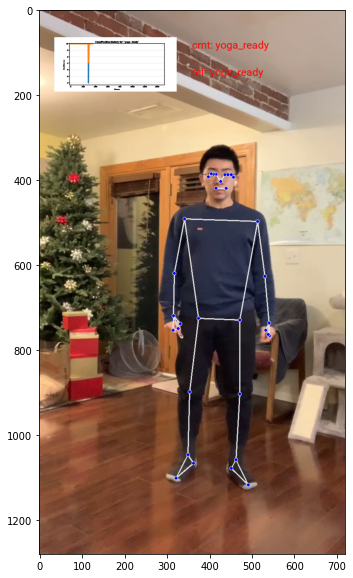

 23%|██▎       | 351/1520.0 [01:07<05:17,  3.68it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 23%|██▎       | 352/1520.0 [01:07<04:39,  4.19it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844552.8176978
start time 1646844552.985695


 23%|██▎       | 353/1520.0 [01:07<04:16,  4.54it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 23%|██▎       | 354/1520.0 [01:07<03:57,  4.91it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844553.1586661
start time 1646844553.3236654


 23%|██▎       | 355/1520.0 [01:08<03:43,  5.21it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 23%|██▎       | 356/1520.0 [01:08<03:37,  5.35it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844553.4976947
start time 1646844553.6626644


 23%|██▎       | 357/1520.0 [01:08<03:31,  5.51it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 24%|██▎       | 358/1520.0 [01:08<03:26,  5.62it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844553.835665
start time 1646844554.0016656


 24%|██▎       | 359/1520.0 [01:08<03:23,  5.71it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 24%|██▎       | 360/1520.0 [01:08<03:20,  5.78it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844554.171694
start time 1646844554.337666


 24%|██▍       | 361/1520.0 [01:09<03:18,  5.84it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 24%|██▍       | 362/1520.0 [01:09<03:24,  5.68it/s]

start time 1646844554.5126958
start time 1646844554.715696


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 24%|██▍       | 363/1520.0 [01:09<03:32,  5.44it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 24%|██▍       | 364/1520.0 [01:09<03:42,  5.19it/s]

start time 1646844554.926665


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 24%|██▍       | 365/1520.0 [01:09<03:45,  5.12it/s]

start time 1646844555.1296911


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 24%|██▍       | 366/1520.0 [01:10<05:21,  3.59it/s]

start time 1646844555.5106661


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 24%|██▍       | 367/1520.0 [01:10<05:03,  3.80it/s]

start time 1646844555.8286653


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 24%|██▍       | 368/1520.0 [01:10<04:45,  4.03it/s]

start time 1646844556.0386648


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 24%|██▍       | 369/1520.0 [01:10<04:40,  4.10it/s]

start time 1646844556.2646644


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 24%|██▍       | 370/1520.0 [01:11<04:29,  4.26it/s]

start time 1646844556.4896672
start time 1646844556.6906664


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 24%|██▍       | 371/1520.0 [01:11<04:18,  4.44it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 24%|██▍       | 372/1520.0 [01:11<04:05,  4.67it/s]

start time 1646844556.8936656
start time 1646844557.0977216


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 25%|██▍       | 373/1520.0 [01:11<04:02,  4.74it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 25%|██▍       | 374/1520.0 [01:11<03:45,  5.09it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844557.2627215
start time 1646844557.425752


 25%|██▍       | 375/1520.0 [01:12<03:33,  5.36it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 25%|██▍       | 376/1520.0 [01:12<03:26,  5.55it/s]

start time 1646844557.592752
start time 1646844557.7587492


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 25%|██▍       | 377/1520.0 [01:12<04:24,  4.33it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 25%|██▍       | 378/1520.0 [01:12<04:02,  4.71it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844558.1087213
start time 1646844558.2717526


 25%|██▍       | 379/1520.0 [01:12<03:44,  5.07it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 25%|██▌       | 380/1520.0 [01:13<03:36,  5.26it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844558.4377232
start time 1646844558.6087234


 25%|██▌       | 381/1520.0 [01:13<03:27,  5.49it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 25%|██▌       | 382/1520.0 [01:13<03:21,  5.64it/s]

start time 1646844558.770761
start time 1646844558.9427226


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 25%|██▌       | 383/1520.0 [01:13<03:20,  5.67it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 25%|██▌       | 384/1520.0 [01:13<03:18,  5.71it/s]

start time 1646844559.1187208
start time 1646844559.2977214


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 25%|██▌       | 385/1520.0 [01:13<03:21,  5.64it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 25%|██▌       | 386/1520.0 [01:14<03:18,  5.71it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844559.473721
start time 1646844559.641752


 25%|██▌       | 387/1520.0 [01:14<03:16,  5.76it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 26%|██▌       | 388/1520.0 [01:14<04:23,  4.29it/s]

start time 1646844559.9397225


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 26%|██▌       | 389/1520.0 [01:14<04:11,  4.49it/s]

start time 1646844560.204846
start time 1646844560.3958108


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 26%|██▌       | 390/1520.0 [01:15<04:01,  4.68it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 26%|██▌       | 391/1520.0 [01:15<04:00,  4.69it/s]

start time 1646844560.6038113
start time 1646844560.790812


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 26%|██▌       | 392/1520.0 [01:15<03:49,  4.93it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 26%|██▌       | 393/1520.0 [01:15<03:43,  5.04it/s]

start time 1646844560.9728117
start time 1646844561.161811


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 26%|██▌       | 394/1520.0 [01:15<03:38,  5.16it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 26%|██▌       | 395/1520.0 [01:16<03:27,  5.43it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844561.3318102
start time 1646844561.4928546


 26%|██▌       | 396/1520.0 [01:16<03:19,  5.62it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 26%|██▌       | 397/1520.0 [01:16<03:48,  4.92it/s]

start time 1646844561.656814


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 26%|██▌       | 398/1520.0 [01:16<03:37,  5.16it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844561.9238124
start time 1646844562.0918126


 26%|██▋       | 399/1520.0 [01:16<03:26,  5.42it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 26%|██▋       | 400/1520.0 [01:16<03:26,  5.43it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844562.2688427
start time 1646844562.444843


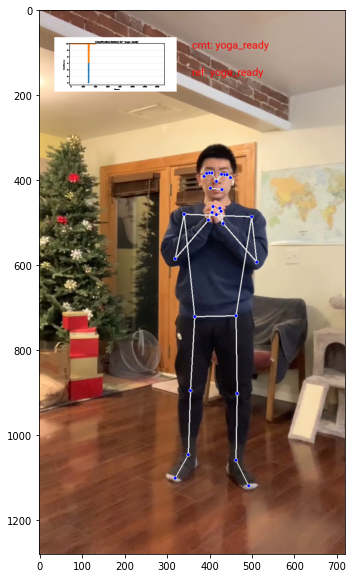

 26%|██▋       | 401/1520.0 [01:17<04:41,  3.97it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 26%|██▋       | 402/1520.0 [01:17<04:13,  4.41it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844562.8508112
start time 1646844563.0168114


 27%|██▋       | 403/1520.0 [01:17<03:52,  4.80it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 27%|██▋       | 404/1520.0 [01:17<03:39,  5.09it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844563.1828108
start time 1646844563.3568428


 27%|██▋       | 405/1520.0 [01:18<03:30,  5.30it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 27%|██▋       | 406/1520.0 [01:18<03:22,  5.51it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844563.5218432
start time 1646844563.6918113


 27%|██▋       | 407/1520.0 [01:18<03:20,  5.55it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 27%|██▋       | 408/1520.0 [01:18<03:16,  5.67it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844563.8648105
start time 1646844564.0328417


 27%|██▋       | 409/1520.0 [01:18<03:13,  5.75it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 27%|██▋       | 410/1520.0 [01:18<03:12,  5.76it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844564.205811
start time 1646844564.371842


 27%|██▋       | 411/1520.0 [01:19<03:12,  5.76it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 27%|██▋       | 412/1520.0 [01:19<03:13,  5.74it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844564.554842
start time 1646844564.7228122


 27%|██▋       | 413/1520.0 [01:19<03:11,  5.77it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 27%|██▋       | 414/1520.0 [01:19<03:13,  5.72it/s]

start time 1646844564.9028106
start time 1646844565.0778432


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 27%|██▋       | 415/1520.0 [01:19<03:13,  5.70it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 27%|██▋       | 416/1520.0 [01:19<03:09,  5.83it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844565.2458415
start time 1646844565.410841


 27%|██▋       | 417/1520.0 [01:20<03:09,  5.82it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 28%|██▊       | 418/1520.0 [01:20<03:15,  5.62it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844565.607813
start time 1646844565.7728114


 28%|██▊       | 419/1520.0 [01:20<03:11,  5.75it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 28%|██▊       | 420/1520.0 [01:20<03:55,  4.67it/s]

start time 1646844566.015811


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844566.329811


 28%|██▊       | 421/1520.0 [01:21<05:01,  3.64it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 28%|██▊       | 422/1520.0 [01:21<04:36,  3.97it/s]

start time 1646844566.6848412


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 28%|██▊       | 423/1520.0 [01:21<04:22,  4.18it/s]

start time 1646844566.8968456
start time 1646844567.0908136


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 28%|██▊       | 424/1520.0 [01:21<04:04,  4.48it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 28%|██▊       | 425/1520.0 [01:21<03:44,  4.88it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844567.2568119
start time 1646844567.4198415


 28%|██▊       | 426/1520.0 [01:22<03:31,  5.17it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 28%|██▊       | 427/1520.0 [01:22<03:22,  5.40it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844567.585842
start time 1646844567.761841


 28%|██▊       | 428/1520.0 [01:22<03:18,  5.50it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 28%|██▊       | 429/1520.0 [01:22<03:19,  5.47it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844567.9448433
start time 1646844568.1078138


 28%|██▊       | 430/1520.0 [01:22<03:12,  5.65it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 28%|██▊       | 431/1520.0 [01:22<03:10,  5.73it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844568.2768419
start time 1646844568.4428418


 28%|██▊       | 432/1520.0 [01:23<03:06,  5.84it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 28%|██▊       | 433/1520.0 [01:23<03:04,  5.90it/s]

start time 1646844568.6078432
start time 1646844568.7808425


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 29%|██▊       | 434/1520.0 [01:23<03:06,  5.82it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 29%|██▊       | 435/1520.0 [01:23<03:06,  5.83it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844568.9568117
start time 1646844569.1348443


 29%|██▊       | 436/1520.0 [01:23<03:08,  5.74it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 29%|██▉       | 437/1520.0 [01:23<03:10,  5.68it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844569.313843
start time 1646844569.4838405


 29%|██▉       | 438/1520.0 [01:24<03:07,  5.78it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 29%|██▉       | 439/1520.0 [01:24<03:07,  5.76it/s]

start time 1646844569.6538446
start time 1646844569.8268118


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 29%|██▉       | 440/1520.0 [01:24<03:42,  4.86it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 29%|██▉       | 441/1520.0 [01:24<03:32,  5.07it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844570.1138115
start time 1646844570.280842


 29%|██▉       | 442/1520.0 [01:24<03:23,  5.31it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 29%|██▉       | 443/1520.0 [01:25<03:16,  5.49it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844570.4498413
start time 1646844570.6198103


 29%|██▉       | 444/1520.0 [01:25<03:11,  5.61it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 29%|██▉       | 445/1520.0 [01:25<03:09,  5.69it/s]

start time 1646844570.7878418
start time 1646844570.9788117


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 29%|██▉       | 446/1520.0 [01:25<03:13,  5.55it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 29%|██▉       | 447/1520.0 [01:25<03:08,  5.70it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844571.1478417
start time 1646844571.3108113


 29%|██▉       | 448/1520.0 [01:25<03:05,  5.77it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 30%|██▉       | 449/1520.0 [01:26<04:05,  4.36it/s]

start time 1646844571.6088123


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 30%|██▉       | 450/1520.0 [01:26<03:52,  4.60it/s]

start time 1646844571.8538125
start time 1646844572.0508413


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


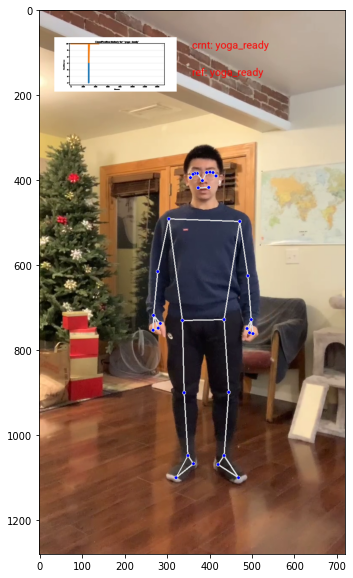

 30%|██▉       | 451/1520.0 [01:27<05:15,  3.39it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 30%|██▉       | 452/1520.0 [01:27<04:35,  3.88it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844572.5048425
start time 1646844572.6768107


 30%|██▉       | 453/1520.0 [01:27<04:05,  4.34it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 30%|██▉       | 454/1520.0 [01:27<03:46,  4.71it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844572.844811
start time 1646844573.009813


 30%|██▉       | 455/1520.0 [01:27<03:33,  4.98it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 30%|███       | 456/1520.0 [01:27<03:29,  5.08it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844573.204811
start time 1646844573.3788426


 30%|███       | 457/1520.0 [01:28<03:19,  5.32it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 30%|███       | 458/1520.0 [01:28<03:13,  5.49it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844573.5428114
start time 1646844573.7078419


 30%|███       | 459/1520.0 [01:28<03:07,  5.67it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 30%|███       | 460/1520.0 [01:28<03:05,  5.71it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844573.8768103
start time 1646844574.0488422


 30%|███       | 461/1520.0 [01:28<03:03,  5.78it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 30%|███       | 462/1520.0 [01:29<03:52,  4.56it/s]

start time 1646844574.228843


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 30%|███       | 463/1520.0 [01:29<03:34,  4.92it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844574.54284
start time 1646844574.7038422


 31%|███       | 464/1520.0 [01:29<03:22,  5.22it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 31%|███       | 465/1520.0 [01:29<03:19,  5.29it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844574.8848112
start time 1646844575.052812


 31%|███       | 466/1520.0 [01:29<03:12,  5.48it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 31%|███       | 467/1520.0 [01:29<03:09,  5.55it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844575.2228124
start time 1646844575.4018414


 31%|███       | 468/1520.0 [01:30<03:06,  5.65it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 31%|███       | 469/1520.0 [01:30<03:03,  5.73it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844575.5668416
start time 1646844575.736842


 31%|███       | 470/1520.0 [01:30<03:01,  5.77it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 31%|███       | 471/1520.0 [01:30<03:01,  5.76it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844575.911811
start time 1646844576.084812


 31%|███       | 472/1520.0 [01:30<03:02,  5.73it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 31%|███       | 473/1520.0 [01:30<02:59,  5.84it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844576.2538412
start time 1646844576.4308453


 31%|███       | 474/1520.0 [01:31<03:01,  5.78it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 31%|███▏      | 475/1520.0 [01:31<02:57,  5.88it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844576.5928416
start time 1646844576.7598112


 31%|███▏      | 476/1520.0 [01:31<02:57,  5.88it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 31%|███▏      | 477/1520.0 [01:31<03:00,  5.79it/s]

start time 1646844576.9448113
start time 1646844577.118842


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 31%|███▏      | 478/1520.0 [01:31<03:27,  5.03it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 32%|███▏      | 479/1520.0 [01:32<03:18,  5.23it/s]

start time 1646844577.3708477
start time 1646844577.5498424


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 32%|███▏      | 480/1520.0 [01:32<03:14,  5.35it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 32%|███▏      | 481/1520.0 [01:32<03:58,  4.36it/s]

start time 1646844577.8018112
exit time 1646844577.8018112


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 32%|███▏      | 482/1520.0 [01:32<04:03,  4.27it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 32%|███▏      | 483/1520.0 [01:32<03:47,  4.55it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 32%|███▏      | 484/1520.0 [01:33<03:46,  4.57it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 32%|███▏      | 485/1520.0 [01:33<03:32,  4.87it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 32%|██

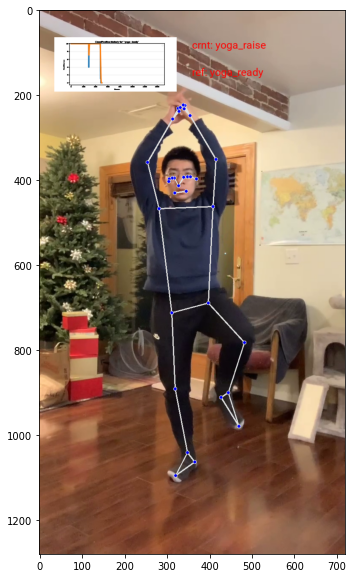

 33%|███▎      | 501/1520.0 [01:36<04:18,  3.94it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 33%|███▎      | 502/1520.0 [01:36<03:53,  4.35it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 33%|███▎      | 503/1520.0 [01:36<03:34,  4.75it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 33%|███▎      | 504/1520.0 [01:36<03:18,  5.12it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 33%|███▎      | 505/1520.0 [01:37<03:08,  5.38it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignor

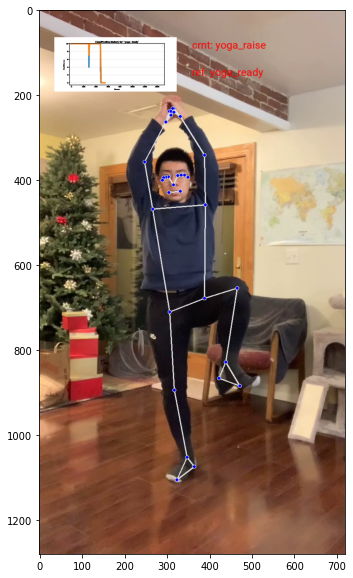

 36%|███▋      | 551/1520.0 [01:45<05:00,  3.23it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 36%|███▋      | 552/1520.0 [01:45<04:26,  3.63it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 36%|███▋      | 553/1520.0 [01:45<03:53,  4.14it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 36%|███▋      | 554/1520.0 [01:46<03:29,  4.61it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 37%|███▋      | 555/1520.0 [01:46<03:14,  4.95it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignor

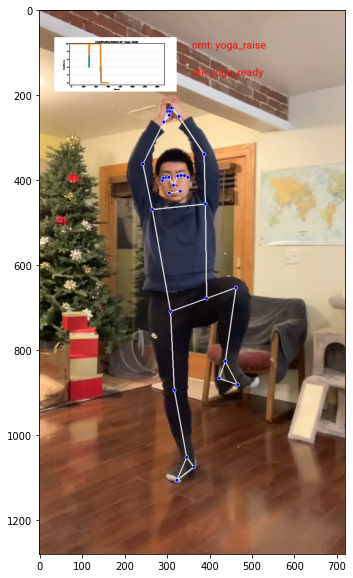

 40%|███▉      | 601/1520.0 [01:54<03:42,  4.12it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 40%|███▉      | 602/1520.0 [01:54<03:23,  4.52it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 40%|███▉      | 603/1520.0 [01:54<03:09,  4.85it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 40%|███▉      | 604/1520.0 [01:54<02:58,  5.14it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 40%|███▉      | 605/1520.0 [01:55<02:54,  5.24it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignor

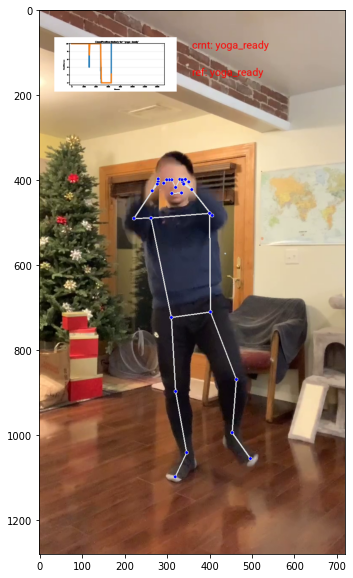

 43%|████▎     | 651/1520.0 [02:03<03:28,  4.17it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 43%|████▎     | 652/1520.0 [02:03<03:12,  4.51it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 43%|████▎     | 653/1520.0 [02:03<02:58,  4.86it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 43%|████▎     | 654/1520.0 [02:04<02:47,  5.17it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 43%|████▎     | 655/1520.0 [02:04<02:43,  5.31it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignor

start time 1646844609.987836
start time 1646844610.1688418


 43%|████▎     | 658/1520.0 [02:04<02:33,  5.62it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 43%|████▎     | 659/1520.0 [02:05<02:30,  5.71it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844610.3358414
start time 1646844610.5038104


 43%|████▎     | 660/1520.0 [02:05<02:28,  5.79it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 43%|████▎     | 661/1520.0 [02:05<02:26,  5.86it/s]

start time 1646844610.6698725
start time 1646844610.8348415


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 44%|████▎     | 662/1520.0 [02:05<03:03,  4.67it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 44%|████▎     | 663/1520.0 [02:05<02:52,  4.97it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844611.154876
start time 1646844611.3208773


 44%|████▎     | 664/1520.0 [02:06<02:43,  5.25it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 44%|████▍     | 665/1520.0 [02:06<02:36,  5.45it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844611.488845
start time 1646844611.6528423


 44%|████▍     | 666/1520.0 [02:06<02:31,  5.62it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 44%|████▍     | 667/1520.0 [02:06<02:29,  5.69it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844611.819873
start time 1646844611.9878757


 44%|████▍     | 668/1520.0 [02:06<02:26,  5.83it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 44%|████▍     | 669/1520.0 [02:06<02:24,  5.89it/s]

start time 1646844612.1528735
start time 1646844612.3288443


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 44%|████▍     | 670/1520.0 [02:07<02:26,  5.81it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 44%|████▍     | 671/1520.0 [02:07<02:23,  5.90it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844612.4958754
start time 1646844612.6558745


 44%|████▍     | 672/1520.0 [02:07<02:21,  6.00it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 44%|████▍     | 673/1520.0 [02:07<02:26,  5.79it/s]

start time 1646844612.8188424


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 44%|████▍     | 674/1520.0 [02:07<03:19,  4.23it/s]

start time 1646844613.1208427


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 44%|████▍     | 675/1520.0 [02:08<03:15,  4.32it/s]

start time 1646844613.4378448
start time 1646844613.6258793


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 44%|████▍     | 676/1520.0 [02:08<03:05,  4.55it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 45%|████▍     | 677/1520.0 [02:08<03:04,  4.57it/s]

start time 1646844613.840874
start time 1646844614.039843


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 45%|████▍     | 678/1520.0 [02:08<02:56,  4.76it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 45%|████▍     | 679/1520.0 [02:08<03:09,  4.45it/s]

start time 1646844614.2198741


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 45%|████▍     | 680/1520.0 [02:09<02:59,  4.69it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844614.4858756
start time 1646844614.657871


 45%|████▍     | 681/1520.0 [02:09<02:47,  5.02it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 45%|████▍     | 682/1520.0 [02:09<02:39,  5.25it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844614.8238475
start time 1646844614.988843


 45%|████▍     | 683/1520.0 [02:09<02:32,  5.50it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 45%|████▌     | 684/1520.0 [02:09<02:27,  5.66it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844615.1528728
start time 1646844615.3208733


 45%|████▌     | 685/1520.0 [02:10<02:27,  5.67it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 45%|████▌     | 686/1520.0 [02:10<02:26,  5.71it/s]

start time 1646844615.4988415
start time 1646844615.672323


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 45%|████▌     | 687/1520.0 [02:10<02:25,  5.73it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 45%|████▌     | 688/1520.0 [02:10<02:24,  5.76it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844615.8433216
start time 1646844616.0133526


 45%|████▌     | 689/1520.0 [02:10<02:22,  5.84it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 45%|████▌     | 690/1520.0 [02:10<02:21,  5.85it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844616.1763222
start time 1646844616.3463225


 45%|████▌     | 691/1520.0 [02:11<02:20,  5.91it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 46%|████▌     | 692/1520.0 [02:11<03:13,  4.29it/s]

start time 1646844616.6403246


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 46%|████▌     | 693/1520.0 [02:11<03:12,  4.29it/s]

start time 1646844616.949324


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 46%|████▌     | 694/1520.0 [02:11<03:07,  4.40it/s]

start time 1646844617.1573222


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 46%|████▌     | 695/1520.0 [02:12<03:08,  4.37it/s]

start time 1646844617.3833232


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 46%|████▌     | 696/1520.0 [02:12<03:06,  4.42it/s]

start time 1646844617.6073236


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 46%|████▌     | 697/1520.0 [02:12<03:12,  4.27it/s]

start time 1646844617.8543258


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 46%|████▌     | 698/1520.0 [02:13<04:27,  3.07it/s]

start time 1646844618.316867


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 46%|████▌     | 699/1520.0 [02:13<04:13,  3.24it/s]

start time 1646844618.6684275


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844618.9184558


 46%|████▌     | 700/1520.0 [02:13<04:34,  2.99it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844619.322454


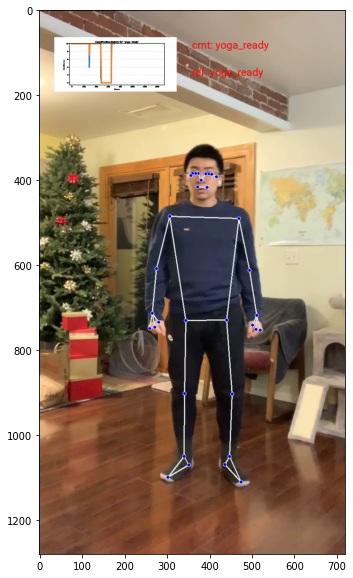

 46%|████▌     | 701/1520.0 [02:14<05:20,  2.55it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 46%|████▌     | 702/1520.0 [02:14<04:56,  2.76it/s]

start time 1646844619.8654523


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 46%|████▋     | 703/1520.0 [02:14<04:48,  2.83it/s]

start time 1646844620.2054546
start time 1646844620.413485


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 46%|████▋     | 704/1520.0 [02:15<04:07,  3.29it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 46%|████▋     | 705/1520.0 [02:15<03:46,  3.60it/s]

start time 1646844620.6264524
start time 1646844620.8194828


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 46%|████▋     | 706/1520.0 [02:15<03:25,  3.97it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 47%|████▋     | 707/1520.0 [02:15<03:06,  4.36it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844621.0084832
start time 1646844621.1804829


 47%|████▋     | 708/1520.0 [02:15<02:53,  4.69it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 47%|████▋     | 709/1520.0 [02:16<02:41,  5.02it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844621.3514824
start time 1646844621.516454


 47%|████▋     | 710/1520.0 [02:16<02:33,  5.29it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 47%|████▋     | 711/1520.0 [02:16<02:27,  5.50it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844621.681482
start time 1646844621.8474507


 47%|████▋     | 712/1520.0 [02:16<02:23,  5.63it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 47%|████▋     | 713/1520.0 [02:16<02:21,  5.70it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844622.0184815
start time 1646844622.1814826


 47%|████▋     | 714/1520.0 [02:16<02:18,  5.83it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 47%|████▋     | 715/1520.0 [02:17<02:48,  4.77it/s]

start time 1646844622.4574537


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 47%|████▋     | 716/1520.0 [02:17<03:02,  4.42it/s]

start time 1646844622.739453
start time 1646844622.9254515


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 47%|████▋     | 717/1520.0 [02:17<02:52,  4.65it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844623.1124523


 47%|████▋     | 718/1520.0 [02:18<04:06,  3.26it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 47%|████▋     | 719/1520.0 [02:18<03:32,  3.76it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844623.626482
start time 1646844623.793482


 47%|████▋     | 720/1520.0 [02:18<03:09,  4.22it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 47%|████▋     | 721/1520.0 [02:18<02:55,  4.56it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844623.9714513
start time 1646844624.1374826


 48%|████▊     | 722/1520.0 [02:18<02:41,  4.93it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 48%|████▊     | 723/1520.0 [02:18<02:34,  5.16it/s]

start time 1646844624.3074837
start time 1646844624.4904828


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 48%|████▊     | 724/1520.0 [02:19<02:31,  5.25it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844624.6654804


 48%|████▊     | 725/1520.0 [02:19<03:04,  4.32it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 48%|████▊     | 726/1520.0 [02:19<02:50,  4.65it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844624.9984848
start time 1646844625.1624827


 48%|████▊     | 727/1520.0 [02:19<02:39,  4.96it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 48%|████▊     | 728/1520.0 [02:20<02:33,  5.15it/s]

start time 1646844625.337482
start time 1646844625.5154831


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 48%|████▊     | 729/1520.0 [02:20<02:30,  5.27it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 48%|████▊     | 730/1520.0 [02:20<03:11,  4.13it/s]

start time 1646844625.8214517


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 48%|████▊     | 731/1520.0 [02:20<03:04,  4.28it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844626.0954514
start time 1646844626.276455


 48%|████▊     | 732/1520.0 [02:20<02:52,  4.56it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 48%|████▊     | 733/1520.0 [02:21<02:52,  4.56it/s]

start time 1646844626.4864523
start time 1646844626.7014515


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 48%|████▊     | 734/1520.0 [02:21<02:47,  4.71it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 48%|████▊     | 735/1520.0 [02:21<02:37,  5.00it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844626.8754516
start time 1646844627.0384827


 48%|████▊     | 736/1520.0 [02:21<02:29,  5.26it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 48%|████▊     | 737/1520.0 [02:21<02:23,  5.44it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844627.2074542
start time 1646844627.3744512


 49%|████▊     | 738/1520.0 [02:22<02:18,  5.63it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 49%|████▊     | 739/1520.0 [02:22<02:15,  5.77it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844627.5394518
start time 1646844627.7064524


 49%|████▊     | 740/1520.0 [02:22<02:14,  5.81it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 49%|████▉     | 741/1520.0 [02:22<02:13,  5.86it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844627.8754508
start time 1646844628.0404818


 49%|████▉     | 742/1520.0 [02:22<02:11,  5.93it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 49%|████▉     | 743/1520.0 [02:22<02:09,  5.99it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844628.2034843
start time 1646844628.365482


 49%|████▉     | 744/1520.0 [02:23<02:09,  6.01it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 49%|████▉     | 745/1520.0 [02:23<02:31,  5.12it/s]

start time 1646844628.5374513


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 49%|████▉     | 746/1520.0 [02:23<02:41,  4.78it/s]

start time 1646844628.8214521


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 49%|████▉     | 747/1520.0 [02:23<03:12,  4.02it/s]

start time 1646844629.1354527
exit time 1646844629.1364527


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 49%|████▉     | 748/1520.0 [02:24<03:00,  4.27it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 49%|████▉     | 749/1520.0 [02:24<02:50,  4.53it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 49%|████▉     | 750/1520.0 [02:24<02:56,  4.37it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


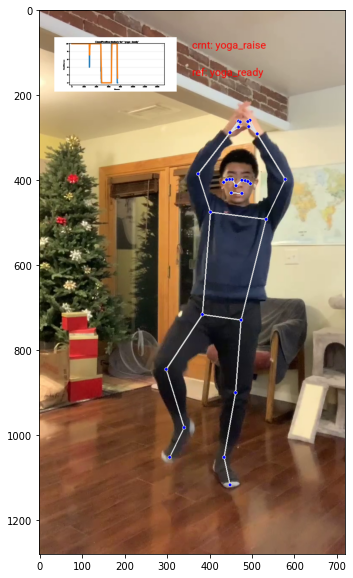

 49%|████▉     | 751/1520.0 [02:24<03:41,  3.47it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 49%|████▉     | 752/1520.0 [02:25<03:12,  3.98it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 50%|████▉     | 753/1520.0 [02:25<02:53,  4.41it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 50%|████▉     | 754/1520.0 [02:25<02:40,  4.79it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 50%|████▉     | 755/1520.0 [02:25<02:32,  5.02it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignor

start time 1646844633.3006263


 51%|█████     | 769/1520.0 [02:28<02:42,  4.64it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 51%|█████     | 770/1520.0 [02:28<02:29,  5.00it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844633.6126275
start time 1646844633.7715957


 51%|█████     | 771/1520.0 [02:28<02:22,  5.27it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 51%|█████     | 772/1520.0 [02:28<02:18,  5.41it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844633.94863
start time 1646844634.115627


 51%|█████     | 773/1520.0 [02:28<02:14,  5.56it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 51%|█████     | 774/1520.0 [02:28<02:14,  5.53it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844634.2986276
start time 1646844634.4756262


 51%|█████     | 775/1520.0 [02:29<02:13,  5.59it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 51%|█████     | 776/1520.0 [02:29<02:10,  5.71it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844634.6415958
start time 1646844634.8075974


 51%|█████     | 777/1520.0 [02:29<02:08,  5.77it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 51%|█████     | 778/1520.0 [02:29<02:12,  5.61it/s]

start time 1646844634.9815948


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 51%|█████▏    | 779/1520.0 [02:30<02:49,  4.38it/s]

start time 1646844635.2865968


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 51%|█████▏    | 780/1520.0 [02:30<02:44,  4.51it/s]

start time 1646844635.5451398
start time 1646844635.7311082


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 51%|█████▏    | 781/1520.0 [02:30<02:36,  4.72it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 51%|█████▏    | 782/1520.0 [02:30<02:40,  4.60it/s]

start time 1646844635.9581194
start time 1646844636.156106


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 52%|█████▏    | 783/1520.0 [02:30<02:34,  4.76it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 52%|█████▏    | 784/1520.0 [02:31<02:26,  5.03it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844636.3371353
start time 1646844636.509137


 52%|█████▏    | 785/1520.0 [02:31<02:20,  5.22it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 52%|█████▏    | 786/1520.0 [02:31<02:15,  5.40it/s]

start time 1646844636.6771057
start time 1646844636.8461056


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 52%|█████▏    | 787/1520.0 [02:31<02:31,  4.83it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 52%|█████▏    | 788/1520.0 [02:31<02:22,  5.14it/s]

start time 1646844637.107136
start time 1646844637.2831354


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 52%|█████▏    | 789/1520.0 [02:31<02:18,  5.26it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 52%|█████▏    | 790/1520.0 [02:32<02:12,  5.50it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844637.4491382
start time 1646844637.622137


 52%|█████▏    | 791/1520.0 [02:32<02:10,  5.59it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 52%|█████▏    | 792/1520.0 [02:32<02:10,  5.58it/s]

start time 1646844637.7941055
start time 1646844637.9691067


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 52%|█████▏    | 793/1520.0 [02:32<02:08,  5.64it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 52%|█████▏    | 794/1520.0 [02:32<02:05,  5.77it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844638.1361058
start time 1646844638.3001344


 52%|█████▏    | 795/1520.0 [02:32<02:03,  5.88it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 52%|█████▏    | 796/1520.0 [02:33<02:42,  4.47it/s]

start time 1646844638.5351074


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 52%|█████▏    | 797/1520.0 [02:33<02:51,  4.22it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844638.9081376
start time 1646844639.0921369


 52%|█████▎    | 798/1520.0 [02:33<02:39,  4.52it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 53%|█████▎    | 799/1520.0 [02:33<02:37,  4.57it/s]

start time 1646844639.2981057
start time 1646844639.4961061


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 53%|█████▎    | 800/1520.0 [02:34<02:30,  4.77it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844639.6721501


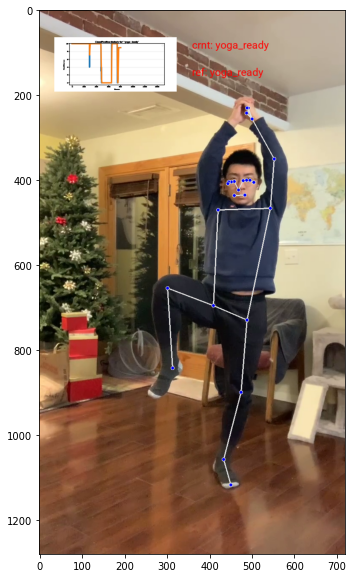

 53%|█████▎    | 801/1520.0 [02:34<03:17,  3.64it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 53%|█████▎    | 802/1520.0 [02:34<02:54,  4.11it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844640.0991368
start time 1646844640.262136


 53%|█████▎    | 803/1520.0 [02:34<02:37,  4.56it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 53%|█████▎    | 804/1520.0 [02:35<02:28,  4.83it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844640.4361355
start time 1646844640.6051066


 53%|█████▎    | 805/1520.0 [02:35<02:19,  5.13it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 53%|█████▎    | 806/1520.0 [02:35<02:15,  5.28it/s]

start time 1646844640.7771263
start time 1646844640.965106


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 53%|█████▎    | 807/1520.0 [02:35<02:13,  5.33it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 53%|█████▎    | 808/1520.0 [02:35<02:08,  5.56it/s]

start time 1646844641.1311362
start time 1646844641.3041365


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 53%|█████▎    | 809/1520.0 [02:36<02:37,  4.50it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 53%|█████▎    | 810/1520.0 [02:36<02:25,  4.90it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844641.6141398
start time 1646844641.7741058


 53%|█████▎    | 811/1520.0 [02:36<02:16,  5.20it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 53%|█████▎    | 812/1520.0 [02:36<03:08,  3.76it/s]

start time 1646844642.1371083


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 53%|█████▎    | 813/1520.0 [02:37<02:51,  4.13it/s]

start time 1646844642.3941061
start time 1646844642.5771375


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 54%|█████▎    | 814/1520.0 [02:37<02:39,  4.43it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 54%|█████▎    | 815/1520.0 [02:37<02:36,  4.49it/s]

start time 1646844642.7901158
start time 1646844642.9771366


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 54%|█████▎    | 816/1520.0 [02:37<02:26,  4.80it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 54%|█████▍    | 817/1520.0 [02:37<02:19,  5.04it/s]

start time 1646844643.1501372
start time 1646844643.3301387


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 54%|█████▍    | 818/1520.0 [02:38<02:15,  5.19it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 54%|█████▍    | 819/1520.0 [02:38<02:08,  5.44it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844643.498137
start time 1646844643.6591249


 54%|█████▍    | 820/1520.0 [02:38<02:04,  5.62it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 54%|█████▍    | 821/1520.0 [02:38<02:06,  5.55it/s]

start time 1646844643.8301055
start time 1646844644.020136


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 54%|█████▍    | 822/1520.0 [02:38<02:05,  5.58it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 54%|█████▍    | 823/1520.0 [02:38<02:04,  5.60it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844644.1941059
start time 1646844644.3651369


 54%|█████▍    | 824/1520.0 [02:39<02:01,  5.72it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 54%|█████▍    | 825/1520.0 [02:39<02:15,  5.12it/s]

start time 1646844644.5331407


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 54%|█████▍    | 826/1520.0 [02:39<02:10,  5.30it/s]

start time 1646844644.7771363


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 54%|█████▍    | 827/1520.0 [02:39<02:35,  4.47it/s]

start time 1646844645.0441058


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 54%|█████▍    | 828/1520.0 [02:40<02:53,  3.98it/s]

start time 1646844645.394106
start time 1646844645.5831313


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 55%|█████▍    | 829/1520.0 [02:40<02:40,  4.30it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 55%|█████▍    | 830/1520.0 [02:40<02:37,  4.38it/s]

start time 1646844645.7971606
start time 1646844645.9921627


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 55%|█████▍    | 831/1520.0 [02:40<02:29,  4.60it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 55%|█████▍    | 832/1520.0 [02:40<02:20,  4.91it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844646.1731625
start time 1646844646.335131


 55%|█████▍    | 833/1520.0 [02:41<02:11,  5.22it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 55%|█████▍    | 834/1520.0 [02:41<02:08,  5.35it/s]

start time 1646844646.5131612


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 55%|█████▍    | 835/1520.0 [02:41<02:43,  4.20it/s]

start time 1646844646.797646


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 55%|█████▌    | 836/1520.0 [02:41<02:36,  4.37it/s]

start time 1646844647.0708468
start time 1646844647.2518752


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 55%|█████▌    | 837/1520.0 [02:41<02:27,  4.64it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 55%|█████▌    | 838/1520.0 [02:42<02:27,  4.63it/s]

start time 1646844647.4618454
start time 1646844647.6578455


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 55%|█████▌    | 839/1520.0 [02:42<02:20,  4.85it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 55%|█████▌    | 840/1520.0 [02:42<02:14,  5.07it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844647.8368447
start time 1646844648.0018756


 55%|█████▌    | 841/1520.0 [02:42<02:07,  5.33it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 55%|█████▌    | 842/1520.0 [02:42<02:02,  5.55it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844648.1678755
start time 1646844648.3308449


 55%|█████▌    | 843/1520.0 [02:43<01:58,  5.72it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 56%|█████▌    | 844/1520.0 [02:43<01:57,  5.77it/s]

start time 1646844648.497845
start time 1646844648.673846


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 56%|█████▌    | 845/1520.0 [02:43<02:19,  4.85it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 56%|█████▌    | 846/1520.0 [02:43<02:13,  5.05it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844648.9638743
start time 1646844649.1288447


 56%|█████▌    | 847/1520.0 [02:43<02:06,  5.31it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 56%|█████▌    | 848/1520.0 [02:43<02:05,  5.37it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844649.3088796
start time 1646844649.4748473


 56%|█████▌    | 849/1520.0 [02:44<02:00,  5.55it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 56%|█████▌    | 850/1520.0 [02:44<01:59,  5.61it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844649.6418455
start time 1646844649.8188446


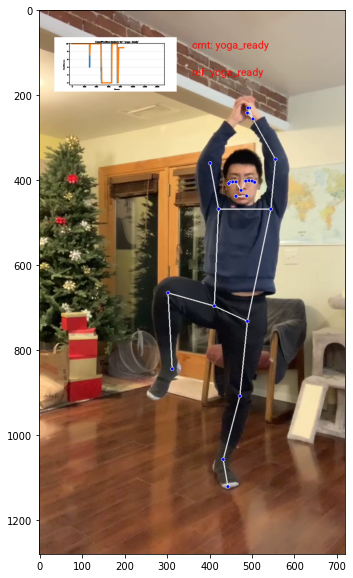

 56%|█████▌    | 851/1520.0 [02:44<02:47,  4.00it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 56%|█████▌    | 852/1520.0 [02:44<02:31,  4.42it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844650.2348785
start time 1646844650.4008775


 56%|█████▌    | 853/1520.0 [02:45<02:18,  4.82it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 56%|█████▌    | 854/1520.0 [02:45<02:45,  4.03it/s]

start time 1646844650.6628468


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 56%|█████▋    | 855/1520.0 [02:45<02:53,  3.84it/s]

start time 1646844651.0218825
start time 1646844651.2108817


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 56%|█████▋    | 856/1520.0 [02:45<02:38,  4.19it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 56%|█████▋    | 857/1520.0 [02:46<02:31,  4.38it/s]

start time 1646844651.4058821
start time 1646844651.6019146


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 56%|█████▋    | 858/1520.0 [02:46<02:22,  4.63it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 57%|█████▋    | 859/1520.0 [02:46<02:15,  4.88it/s]

start time 1646844651.787911
start time 1646844651.9669151


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 57%|█████▋    | 860/1520.0 [02:46<02:11,  5.01it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 57%|█████▋    | 861/1520.0 [02:46<02:04,  5.30it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844652.1428816
start time 1646844652.3029127


 57%|█████▋    | 862/1520.0 [02:46<01:58,  5.53it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 57%|█████▋    | 863/1520.0 [02:47<02:26,  4.49it/s]

start time 1646844652.5328815


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 57%|█████▋    | 864/1520.0 [02:47<02:37,  4.17it/s]

start time 1646844652.889883
start time 1646844653.083914


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 57%|█████▋    | 865/1520.0 [02:47<02:27,  4.43it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 57%|█████▋    | 866/1520.0 [02:47<02:25,  4.48it/s]

start time 1646844653.292882
start time 1646844653.4908824


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 57%|█████▋    | 867/1520.0 [02:48<02:17,  4.73it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 57%|█████▋    | 868/1520.0 [02:48<02:11,  4.97it/s]

start time 1646844653.6758811
start time 1646844653.836881


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 57%|█████▋    | 869/1520.0 [02:48<02:34,  4.20it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 57%|█████▋    | 870/1520.0 [02:48<02:22,  4.55it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844654.1759136
start time 1646844654.3409104


 57%|█████▋    | 871/1520.0 [02:49<02:12,  4.90it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 57%|█████▋    | 872/1520.0 [02:49<02:05,  5.18it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844654.5089474
start time 1646844654.6739502


 57%|█████▋    | 873/1520.0 [02:49<01:59,  5.43it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 57%|█████▊    | 874/1520.0 [02:49<02:08,  5.01it/s]

start time 1646844654.876921


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 58%|█████▊    | 875/1520.0 [02:49<02:34,  4.18it/s]

start time 1646844655.1959212


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 58%|█████▊    | 876/1520.0 [02:50<02:25,  4.44it/s]

start time 1646844655.4240932
start time 1646844655.6130948


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 58%|█████▊    | 877/1520.0 [02:50<02:19,  4.62it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 58%|█████▊    | 878/1520.0 [02:50<02:17,  4.68it/s]

start time 1646844655.8260632
start time 1646844656.0200636


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 58%|█████▊    | 879/1520.0 [02:50<02:13,  4.81it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 58%|█████▊    | 880/1520.0 [02:50<02:05,  5.09it/s]

start time 1646844656.1990936
start time 1646844656.3750951


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 58%|█████▊    | 881/1520.0 [02:51<02:07,  5.02it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 58%|█████▊    | 882/1520.0 [02:51<02:33,  4.17it/s]

start time 1646844656.696064


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 58%|█████▊    | 883/1520.0 [02:51<02:23,  4.43it/s]

start time 1646844656.9250634
start time 1646844657.1100965


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 58%|█████▊    | 884/1520.0 [02:51<02:16,  4.67it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 58%|█████▊    | 885/1520.0 [02:52<02:21,  4.50it/s]

start time 1646844657.350064


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 58%|█████▊    | 886/1520.0 [02:52<02:16,  4.64it/s]

start time 1646844657.5520642
start time 1646844657.7320948


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 58%|█████▊    | 887/1520.0 [02:52<02:25,  4.36it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 58%|█████▊    | 888/1520.0 [02:52<02:14,  4.71it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844657.995094
start time 1646844658.1580648


 58%|█████▊    | 889/1520.0 [02:52<02:04,  5.06it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 59%|█████▊    | 890/1520.0 [02:53<02:36,  4.03it/s]

start time 1646844658.4460647


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 59%|█████▊    | 891/1520.0 [02:53<02:30,  4.18it/s]

start time 1646844658.7370656
start time 1646844658.9350662


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 59%|█████▊    | 892/1520.0 [02:53<02:22,  4.40it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 59%|█████▉    | 893/1520.0 [02:53<02:19,  4.50it/s]

start time 1646844659.1400635
start time 1646844659.3390644


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 59%|█████▉    | 894/1520.0 [02:54<02:13,  4.69it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 59%|█████▉    | 895/1520.0 [02:54<02:05,  4.98it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844659.518065
start time 1646844659.6920657


 59%|█████▉    | 896/1520.0 [02:54<02:00,  5.16it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 59%|█████▉    | 897/1520.0 [02:54<01:57,  5.31it/s]

start time 1646844659.8691168
start time 1646844660.0471163


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 59%|█████▉    | 898/1520.0 [02:54<01:58,  5.27it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 59%|█████▉    | 899/1520.0 [02:55<02:35,  4.00it/s]

start time 1646844660.433143


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 59%|█████▉    | 900/1520.0 [02:55<02:23,  4.32it/s]

start time 1646844660.63621


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844660.8307576


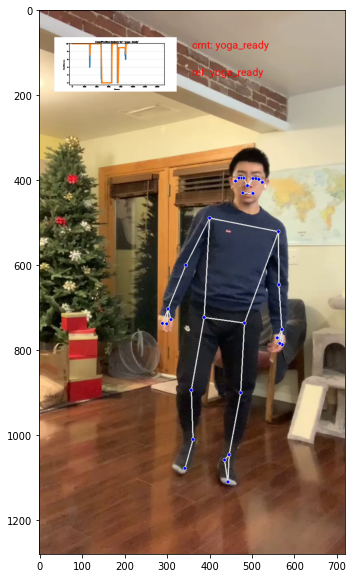

 59%|█████▉    | 901/1520.0 [02:55<03:09,  3.27it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 59%|█████▉    | 902/1520.0 [02:55<02:48,  3.67it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844661.3157575
start time 1646844661.4817576


 59%|█████▉    | 903/1520.0 [02:56<02:28,  4.16it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 59%|█████▉    | 904/1520.0 [02:56<02:42,  3.80it/s]

start time 1646844661.743758


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 60%|█████▉    | 905/1520.0 [02:56<02:45,  3.71it/s]

start time 1646844662.0747583
start time 1646844662.2617598


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 60%|█████▉    | 906/1520.0 [02:56<02:30,  4.08it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 60%|█████▉    | 907/1520.0 [02:57<02:21,  4.32it/s]

start time 1646844662.4557586
start time 1646844662.648757


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 60%|█████▉    | 908/1520.0 [02:57<02:12,  4.61it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844662.831758


 60%|█████▉    | 909/1520.0 [02:57<02:33,  3.98it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 60%|█████▉    | 910/1520.0 [02:57<02:17,  4.42it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844663.155759
start time 1646844663.3177898


 60%|█████▉    | 911/1520.0 [02:57<02:06,  4.83it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 60%|██████    | 912/1520.0 [02:58<01:58,  5.12it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844663.4837573
start time 1646844663.6487582


 60%|██████    | 913/1520.0 [02:58<01:52,  5.37it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 60%|██████    | 914/1520.0 [02:58<01:50,  5.50it/s]

start time 1646844663.8137894


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 60%|██████    | 915/1520.0 [02:58<02:11,  4.61it/s]

start time 1646844664.0577579


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 60%|██████    | 916/1520.0 [02:59<02:10,  4.64it/s]

start time 1646844664.3227582
start time 1646844664.506758


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 60%|██████    | 917/1520.0 [02:59<02:04,  4.83it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 60%|██████    | 918/1520.0 [02:59<02:03,  4.86it/s]

start time 1646844664.705759
start time 1646844664.9127574


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 60%|██████    | 919/1520.0 [02:59<02:01,  4.93it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 61%|██████    | 920/1520.0 [02:59<01:57,  5.11it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844665.0947578
start time 1646844665.2687583


 61%|██████    | 921/1520.0 [02:59<01:54,  5.25it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 61%|██████    | 922/1520.0 [03:00<02:17,  4.35it/s]

start time 1646844665.5367608


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 61%|██████    | 923/1520.0 [03:00<02:12,  4.50it/s]

start time 1646844665.7907584
start time 1646844665.9837575


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 61%|██████    | 924/1520.0 [03:00<02:07,  4.69it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 61%|██████    | 925/1520.0 [03:00<02:26,  4.07it/s]

start time 1646844666.1757581


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 61%|██████    | 926/1520.0 [03:01<02:14,  4.43it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844666.4937887
start time 1646844666.657789


 61%|██████    | 927/1520.0 [03:01<02:02,  4.84it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 61%|██████    | 928/1520.0 [03:01<02:12,  4.46it/s]

start time 1646844666.8647587


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 61%|██████    | 929/1520.0 [03:01<02:27,  4.00it/s]

start time 1646844667.2097585
start time 1646844667.4207582


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 61%|██████    | 930/1520.0 [03:02<02:19,  4.23it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 61%|██████▏   | 931/1520.0 [03:02<02:12,  4.44it/s]

start time 1646844667.617758


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 61%|██████▏   | 932/1520.0 [03:02<02:08,  4.58it/s]

start time 1646844667.8287587
start time 1646844668.0137582


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 61%|██████▏   | 933/1520.0 [03:02<02:01,  4.85it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 61%|██████▏   | 934/1520.0 [03:02<01:53,  5.16it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844668.1817577
start time 1646844668.3457572


 62%|██████▏   | 935/1520.0 [03:03<01:47,  5.43it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 62%|██████▏   | 936/1520.0 [03:03<02:10,  4.49it/s]

start time 1646844668.6047585


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 62%|██████▏   | 937/1520.0 [03:03<02:26,  3.99it/s]

start time 1646844668.9352717


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 62%|██████▏   | 938/1520.0 [03:03<02:15,  4.30it/s]

start time 1646844669.152269


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 62%|██████▏   | 939/1520.0 [03:04<02:16,  4.27it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844669.3902702
start time 1646844669.573269


 62%|██████▏   | 940/1520.0 [03:04<02:06,  4.59it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 62%|██████▏   | 941/1520.0 [03:04<02:01,  4.77it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844669.7702692
start time 1646844669.948269


 62%|██████▏   | 942/1520.0 [03:04<01:56,  4.98it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 62%|██████▏   | 943/1520.0 [03:04<02:18,  4.17it/s]

start time 1646844670.1912708


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 62%|██████▏   | 944/1520.0 [03:05<02:19,  4.13it/s]

start time 1646844670.5212698
start time 1646844670.7082686


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 62%|██████▏   | 945/1520.0 [03:05<02:30,  3.81it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 62%|██████▏   | 946/1520.0 [03:05<02:23,  4.00it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844671.0482693
start time 1646844671.2332683


 62%|██████▏   | 947/1520.0 [03:05<02:10,  4.39it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 62%|██████▏   | 948/1520.0 [03:06<01:59,  4.77it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844671.404269
start time 1646844671.567269


 62%|██████▏   | 949/1520.0 [03:06<01:52,  5.08it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 62%|██████▎   | 950/1520.0 [03:06<01:47,  5.28it/s]

start time 1646844671.7422817
start time 1646844671.9292989


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


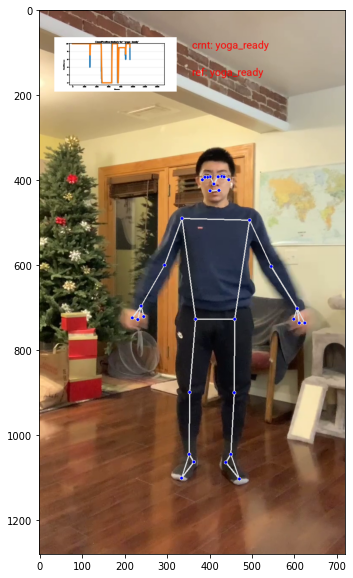

 63%|██████▎   | 951/1520.0 [03:06<02:30,  3.79it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 63%|██████▎   | 952/1520.0 [03:07<02:13,  4.27it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844672.3462706
start time 1646844672.507269
exit time 1646844672.507269


 63%|██████▎   | 953/1520.0 [03:07<02:00,  4.71it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 63%|██████▎   | 954/1520.0 [03:07<01:52,  5.01it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 63%|██████▎   | 955/1520.0 [03:07<01:47,  5.27it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 63%|██████▎   | 956/1520.0 [03:07<01:45,  5.34it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 63%|██████▎   | 957/1520.0 [03:07<01:41,  5.57it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignor

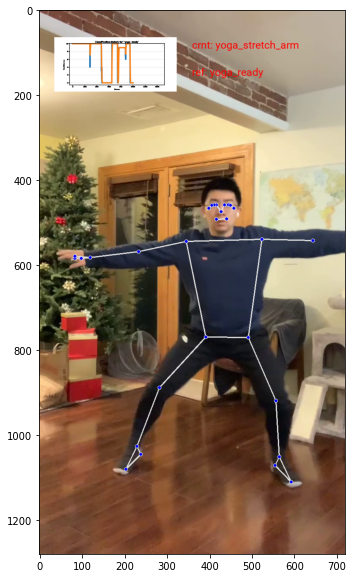

 66%|██████▌   | 1001/1520.0 [03:16<02:10,  3.99it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 66%|██████▌   | 1002/1520.0 [03:16<01:57,  4.40it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 66%|██████▌   | 1003/1520.0 [03:16<01:47,  4.80it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 66%|██████▌   | 1004/1520.0 [03:16<01:40,  5.14it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 66%|██████▌   | 1005/1520.0 [03:17<01:35,  5.39it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are 

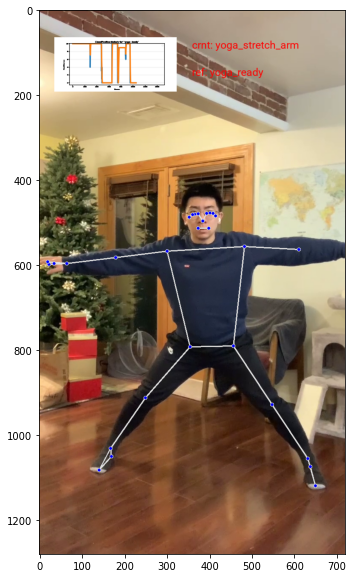

 69%|██████▉   | 1051/1520.0 [03:25<01:56,  4.04it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 69%|██████▉   | 1052/1520.0 [03:25<01:51,  4.19it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 69%|██████▉   | 1053/1520.0 [03:25<02:03,  3.78it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 69%|██████▉   | 1054/1520.0 [03:26<01:59,  3.91it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 69%|██████▉   | 1055/1520.0 [03:26<01:49,  4.26it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are 

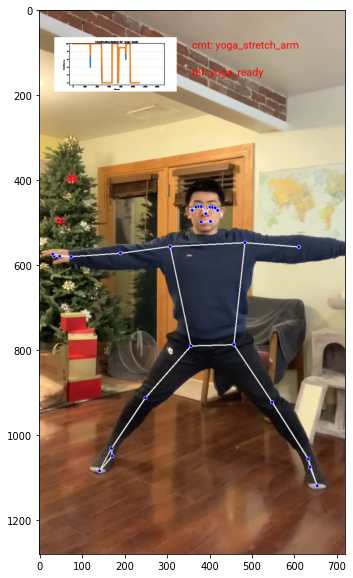

 72%|███████▏  | 1101/1520.0 [03:34<01:41,  4.12it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 72%|███████▎  | 1102/1520.0 [03:34<01:32,  4.51it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 73%|███████▎  | 1103/1520.0 [03:34<01:25,  4.87it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 73%|███████▎  | 1104/1520.0 [03:35<01:20,  5.15it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 73%|███████▎  | 1105/1520.0 [03:35<01:19,  5.25it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are 

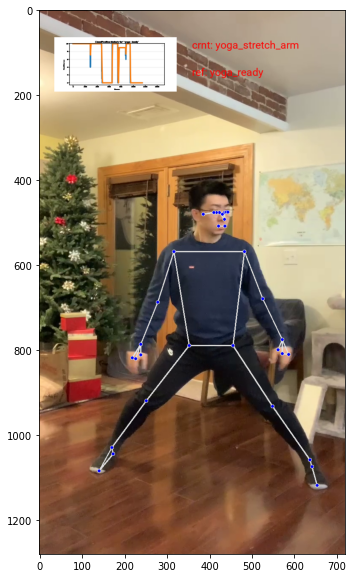

 76%|███████▌  | 1151/1520.0 [03:43<01:31,  4.05it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 76%|███████▌  | 1152/1520.0 [03:44<01:24,  4.33it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 76%|███████▌  | 1153/1520.0 [03:44<01:17,  4.71it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 76%|███████▌  | 1154/1520.0 [03:44<01:12,  5.04it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 76%|███████▌  | 1155/1520.0 [03:44<01:10,  5.21it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are 

start time 1646844710.8888958
start time 1646844711.0699112


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 76%|███████▋  | 1162/1520.0 [03:45<01:03,  5.65it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 77%|███████▋  | 1163/1520.0 [03:45<01:02,  5.73it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844711.2439268
start time 1646844711.403894


 77%|███████▋  | 1164/1520.0 [03:46<01:00,  5.86it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 77%|███████▋  | 1165/1520.0 [03:46<01:00,  5.88it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844711.5709243
start time 1646844711.7349226


 77%|███████▋  | 1166/1520.0 [03:46<00:59,  5.95it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 77%|███████▋  | 1167/1520.0 [03:46<01:21,  4.32it/s]

start time 1646844712.0088956


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 77%|███████▋  | 1168/1520.0 [03:47<01:25,  4.13it/s]

start time 1646844712.370895
start time 1646844712.5629916


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 77%|███████▋  | 1169/1520.0 [03:47<01:41,  3.44it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 77%|███████▋  | 1170/1520.0 [03:47<01:31,  3.83it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844712.973961
start time 1646844713.1399596


 77%|███████▋  | 1171/1520.0 [03:47<01:20,  4.33it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 77%|███████▋  | 1172/1520.0 [03:48<01:15,  4.61it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844713.3159926
start time 1646844713.4899616


 77%|███████▋  | 1173/1520.0 [03:48<01:10,  4.95it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 77%|███████▋  | 1174/1520.0 [03:48<01:19,  4.35it/s]

start time 1646844713.7309613


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 77%|███████▋  | 1175/1520.0 [03:48<01:24,  4.06it/s]

start time 1646844714.0589604
start time 1646844714.24496


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 77%|███████▋  | 1176/1520.0 [03:48<01:18,  4.38it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 77%|███████▋  | 1177/1520.0 [03:49<01:16,  4.46it/s]

start time 1646844714.44796


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 78%|███████▊  | 1178/1520.0 [03:49<01:13,  4.64it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 78%|███████▊  | 1179/1520.0 [03:49<01:23,  4.06it/s]

start time 1646844714.6509929
start time 1646844714.9099617


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 78%|███████▊  | 1180/1520.0 [03:49<01:26,  3.93it/s]

start time 1646844715.2449603
start time 1646844715.4379618


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 78%|███████▊  | 1181/1520.0 [03:50<01:20,  4.23it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 78%|███████▊  | 1182/1520.0 [03:50<01:17,  4.38it/s]

start time 1646844715.6389616
start time 1646844715.8379605


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 78%|███████▊  | 1183/1520.0 [03:50<01:12,  4.62it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 78%|███████▊  | 1184/1520.0 [03:50<01:24,  3.99it/s]

start time 1646844716.1134758


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 78%|███████▊  | 1185/1520.0 [03:51<01:24,  3.97it/s]

start time 1646844716.4234757
start time 1646844716.614476


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 78%|███████▊  | 1186/1520.0 [03:51<01:17,  4.29it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 78%|███████▊  | 1187/1520.0 [03:51<01:27,  3.79it/s]

start time 1646844716.8154771


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 78%|███████▊  | 1188/1520.0 [03:51<01:22,  4.00it/s]

start time 1646844717.1425


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 78%|███████▊  | 1189/1520.0 [03:52<01:33,  3.54it/s]

start time 1646844717.4855008


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 78%|███████▊  | 1190/1520.0 [03:52<01:26,  3.83it/s]

start time 1646844717.7344992
start time 1646844717.9265


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 78%|███████▊  | 1191/1520.0 [03:52<01:18,  4.17it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 78%|███████▊  | 1192/1520.0 [03:52<01:16,  4.31it/s]

start time 1646844718.1385028


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 78%|███████▊  | 1193/1520.0 [03:53<01:26,  3.76it/s]

start time 1646844718.412502


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 79%|███████▊  | 1194/1520.0 [03:53<01:27,  3.73it/s]

start time 1646844718.7460155


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 79%|███████▊  | 1195/1520.0 [03:53<01:19,  4.07it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 79%|███████▊  | 1196/1520.0 [03:53<01:16,  4.25it/s]

start time 1646844718.9490166
start time 1646844719.1560152
start time 1646844719.353037


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 79%|███████▉  | 1197/1520.0 [03:54<01:12,  4.47it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 79%|███████▉  | 1198/1520.0 [03:54<01:24,  3.80it/s]

start time 1646844719.685014


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 79%|███████▉  | 1199/1520.0 [03:54<01:24,  3.81it/s]

start time 1646844719.9720154
start time 1646844720.1645465


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 79%|███████▉  | 1200/1520.0 [03:54<01:16,  4.16it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844720.3695467


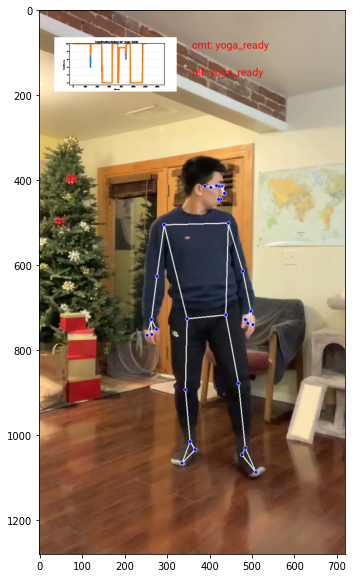

 79%|███████▉  | 1201/1520.0 [03:55<01:55,  2.76it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 79%|███████▉  | 1202/1520.0 [03:55<01:49,  2.90it/s]

start time 1646844721.113547
start time 1646844721.3035476


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 79%|███████▉  | 1203/1520.0 [03:55<01:34,  3.34it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 79%|███████▉  | 1204/1520.0 [03:56<01:26,  3.64it/s]

start time 1646844721.5165527
start time 1646844721.7135472


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 79%|███████▉  | 1205/1520.0 [03:56<01:18,  4.04it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 79%|███████▉  | 1206/1520.0 [03:56<01:11,  4.37it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844721.9005458
start time 1646844722.072547


 79%|███████▉  | 1207/1520.0 [03:56<01:06,  4.68it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 79%|███████▉  | 1208/1520.0 [03:57<01:17,  4.04it/s]

start time 1646844722.3365486


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844722.649546


 80%|███████▉  | 1209/1520.0 [03:57<01:31,  3.40it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 80%|███████▉  | 1210/1520.0 [03:57<01:22,  3.75it/s]

start time 1646844722.9935465


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 80%|███████▉  | 1211/1520.0 [03:57<01:18,  3.94it/s]

start time 1646844723.221548
start time 1646844723.426546


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 80%|███████▉  | 1212/1520.0 [03:58<01:14,  4.14it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 80%|███████▉  | 1213/1520.0 [03:58<01:22,  3.74it/s]

start time 1646844723.7370703


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 80%|███████▉  | 1214/1520.0 [03:58<01:16,  3.98it/s]

start time 1646844723.9830594
start time 1646844724.1730921


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 80%|███████▉  | 1215/1520.0 [03:58<01:11,  4.28it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 80%|████████  | 1216/1520.0 [03:59<01:10,  4.31it/s]

start time 1646844724.4030597
start time 1646844724.5960603


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 80%|████████  | 1217/1520.0 [03:59<01:12,  4.21it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 80%|████████  | 1218/1520.0 [03:59<01:22,  3.66it/s]

start time 1646844725.004061
start time 1646844725.2000594


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 80%|████████  | 1219/1520.0 [03:59<01:14,  4.01it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 80%|████████  | 1220/1520.0 [04:00<01:12,  4.13it/s]

start time 1646844725.4040756


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 80%|████████  | 1221/1520.0 [04:00<01:09,  4.33it/s]

start time 1646844725.6340733


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 80%|████████  | 1222/1520.0 [04:00<01:20,  3.70it/s]

start time 1646844725.9390745


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 80%|████████  | 1223/1520.0 [04:00<01:16,  3.90it/s]

start time 1646844726.2190735
start time 1646844726.406072


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 81%|████████  | 1224/1520.0 [04:01<01:09,  4.26it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 81%|████████  | 1225/1520.0 [04:01<01:17,  3.78it/s]

start time 1646844726.6145859


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 81%|████████  | 1226/1520.0 [04:01<01:20,  3.64it/s]

start time 1646844727.0076063


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 81%|████████  | 1227/1520.0 [04:01<01:20,  3.65it/s]

start time 1646844727.3096058
start time 1646844727.4966428


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 81%|████████  | 1228/1520.0 [04:02<01:12,  4.05it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 81%|████████  | 1229/1520.0 [04:02<01:09,  4.21it/s]

start time 1646844727.689607


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 81%|████████  | 1230/1520.0 [04:02<01:07,  4.32it/s]

start time 1646844727.9276059


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 81%|████████  | 1231/1520.0 [04:02<01:13,  3.93it/s]

start time 1646844728.1946073


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 81%|████████  | 1232/1520.0 [04:03<01:10,  4.10it/s]

start time 1646844728.457606
start time 1646844728.6416054


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 81%|████████  | 1233/1520.0 [04:03<01:04,  4.42it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 81%|████████  | 1234/1520.0 [04:03<01:02,  4.56it/s]

start time 1646844728.837606


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 81%|████████▏ | 1235/1520.0 [04:03<01:02,  4.53it/s]

start time 1646844729.063606
start time 1646844729.249606


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 81%|████████▏ | 1236/1520.0 [04:03<01:02,  4.58it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 81%|████████▏ | 1237/1520.0 [04:04<01:19,  3.57it/s]

start time 1646844729.6616082


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 81%|████████▏ | 1238/1520.0 [04:04<01:13,  3.84it/s]

start time 1646844729.9196067
start time 1646844730.1116388


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 82%|████████▏ | 1239/1520.0 [04:04<01:07,  4.14it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 82%|████████▏ | 1240/1520.0 [04:05<01:05,  4.30it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844730.329638
start time 1646844730.5086067


 82%|████████▏ | 1241/1520.0 [04:05<01:04,  4.31it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 82%|████████▏ | 1242/1520.0 [04:05<01:14,  3.75it/s]

start time 1646844730.8761492


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 82%|████████▏ | 1243/1520.0 [04:05<01:08,  4.06it/s]

start time 1646844731.1051795
start time 1646844731.295147


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 82%|████████▏ | 1244/1520.0 [04:05<01:03,  4.37it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844731.5041473


 82%|████████▏ | 1245/1520.0 [04:06<01:10,  3.89it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 82%|████████▏ | 1246/1520.0 [04:06<01:16,  3.58it/s]

start time 1646844731.905149


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 82%|████████▏ | 1247/1520.0 [04:06<01:14,  3.69it/s]

start time 1646844732.1991465
start time 1646844732.383147


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 82%|████████▏ | 1248/1520.0 [04:07<01:06,  4.08it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 82%|████████▏ | 1249/1520.0 [04:07<01:04,  4.20it/s]

start time 1646844732.589148


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 82%|████████▏ | 1250/1520.0 [04:07<01:13,  3.67it/s]

start time 1646844732.862148


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844733.2571476


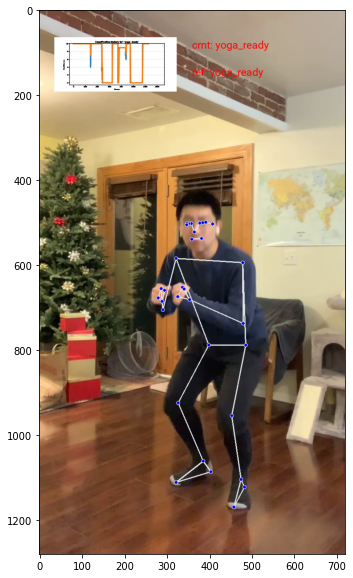

 82%|████████▏ | 1251/1520.0 [04:08<01:38,  2.72it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 82%|████████▏ | 1252/1520.0 [04:08<01:26,  3.11it/s]

start time 1646844733.7601476


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 82%|████████▏ | 1253/1520.0 [04:08<01:29,  2.98it/s]

start time 1646844734.1051478


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 82%|████████▎ | 1254/1520.0 [04:09<01:19,  3.35it/s]

start time 1646844734.3371491
start time 1646844734.5291474


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 83%|████████▎ | 1255/1520.0 [04:09<01:10,  3.76it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 83%|████████▎ | 1256/1520.0 [04:09<01:06,  3.97it/s]

start time 1646844734.7441473
start time 1646844734.9431467


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 83%|████████▎ | 1257/1520.0 [04:09<01:03,  4.16it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 83%|████████▎ | 1258/1520.0 [04:09<01:10,  3.70it/s]

start time 1646844735.2551475


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 83%|████████▎ | 1259/1520.0 [04:10<01:06,  3.93it/s]

start time 1646844735.520148
start time 1646844735.707149


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 83%|████████▎ | 1260/1520.0 [04:10<01:00,  4.26it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 83%|████████▎ | 1261/1520.0 [04:10<00:59,  4.35it/s]

start time 1646844735.9221475


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 83%|████████▎ | 1262/1520.0 [04:10<00:57,  4.45it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 83%|████████▎ | 1263/1520.0 [04:11<01:04,  3.96it/s]

start time 1646844736.124147
start time 1646844736.436149


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 83%|████████▎ | 1264/1520.0 [04:11<01:02,  4.07it/s]

start time 1646844736.6882143
start time 1646844736.8792453


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 83%|████████▎ | 1265/1520.0 [04:11<00:58,  4.36it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 83%|████████▎ | 1266/1520.0 [04:11<00:57,  4.45it/s]

start time 1646844737.0912132
start time 1646844737.270246


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 83%|████████▎ | 1267/1520.0 [04:12<00:59,  4.23it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 83%|████████▎ | 1268/1520.0 [04:12<01:07,  3.76it/s]

start time 1646844737.6802168
start time 1646844737.883245


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 83%|████████▎ | 1269/1520.0 [04:12<01:13,  3.40it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 84%|████████▎ | 1270/1520.0 [04:12<01:07,  3.73it/s]

start time 1646844738.2582147
start time 1646844738.4522133


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 84%|████████▎ | 1271/1520.0 [04:13<01:00,  4.10it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 84%|████████▎ | 1272/1520.0 [04:13<01:05,  3.80it/s]

start time 1646844738.6992137


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 84%|████████▍ | 1273/1520.0 [04:13<01:03,  3.88it/s]

start time 1646844738.9972131
start time 1646844739.1882455


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 84%|████████▍ | 1274/1520.0 [04:13<00:58,  4.22it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 84%|████████▍ | 1275/1520.0 [04:14<00:56,  4.33it/s]

start time 1646844739.3912146


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 84%|████████▍ | 1276/1520.0 [04:14<00:57,  4.24it/s]

start time 1646844739.6092143


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 84%|████████▍ | 1277/1520.0 [04:14<01:06,  3.67it/s]

start time 1646844739.9742167


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 84%|████████▍ | 1278/1520.0 [04:14<01:00,  4.03it/s]

start time 1646844740.2052157
start time 1646844740.3922453


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 84%|████████▍ | 1279/1520.0 [04:15<00:55,  4.33it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 84%|████████▍ | 1280/1520.0 [04:15<00:54,  4.40it/s]

start time 1646844740.608213
start time 1646844740.8012133


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 84%|████████▍ | 1281/1520.0 [04:15<00:51,  4.60it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844741.0922163


 84%|████████▍ | 1282/1520.0 [04:15<01:06,  3.56it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 84%|████████▍ | 1283/1520.0 [04:16<01:06,  3.57it/s]

start time 1646844741.5103686


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 84%|████████▍ | 1284/1520.0 [04:16<01:00,  3.87it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 85%|████████▍ | 1285/1520.0 [04:16<00:59,  3.93it/s]

start time 1646844741.7123678
start time 1646844741.942375


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 85%|████████▍ | 1286/1520.0 [04:16<00:57,  4.04it/s]

start time 1646844742.1843688
start time 1646844742.54337


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 85%|████████▍ | 1287/1520.0 [04:17<01:24,  2.77it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 85%|████████▍ | 1288/1520.0 [04:17<01:13,  3.14it/s]

start time 1646844743.0383682


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 85%|████████▍ | 1289/1520.0 [04:17<01:06,  3.47it/s]

start time 1646844743.2543693


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 85%|████████▍ | 1290/1520.0 [04:18<01:02,  3.65it/s]

start time 1646844743.4923675
start time 1646844743.7053702


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 85%|████████▍ | 1291/1520.0 [04:18<01:00,  3.76it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 85%|████████▌ | 1292/1520.0 [04:18<01:06,  3.45it/s]

start time 1646844744.08637
start time 1646844744.2833676


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 85%|████████▌ | 1293/1520.0 [04:18<00:59,  3.84it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 85%|████████▌ | 1294/1520.0 [04:19<00:55,  4.06it/s]

start time 1646844744.4773674


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 85%|████████▌ | 1295/1520.0 [04:19<00:54,  4.13it/s]

start time 1646844744.7258775


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 85%|████████▌ | 1296/1520.0 [04:19<00:58,  3.80it/s]

start time 1646844745.0073884


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 85%|████████▌ | 1297/1520.0 [04:20<01:02,  3.55it/s]

start time 1646844745.3593884
start time 1646844745.5583878


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 85%|████████▌ | 1298/1520.0 [04:20<00:56,  3.93it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 85%|████████▌ | 1299/1520.0 [04:20<00:54,  4.09it/s]

start time 1646844745.771389


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 86%|████████▌ | 1300/1520.0 [04:20<01:01,  3.57it/s]

start time 1646844746.0893893


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844746.380395


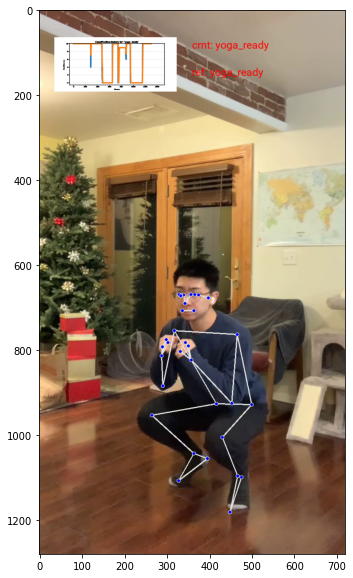

 86%|████████▌ | 1301/1520.0 [04:21<01:17,  2.84it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 86%|████████▌ | 1302/1520.0 [04:21<01:12,  3.01it/s]

start time 1646844746.944389


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 86%|████████▌ | 1303/1520.0 [04:21<01:13,  2.95it/s]

start time 1646844747.19839


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 86%|████████▌ | 1304/1520.0 [04:22<01:08,  3.13it/s]

start time 1646844747.5788996
start time 1646844747.7668998


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 86%|████████▌ | 1305/1520.0 [04:22<01:00,  3.55it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 86%|████████▌ | 1306/1520.0 [04:22<00:57,  3.73it/s]

start time 1646844748.000899
start time 1646844748.1929


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 86%|████████▌ | 1307/1520.0 [04:22<00:56,  3.77it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 86%|████████▌ | 1308/1520.0 [04:23<01:00,  3.52it/s]

start time 1646844748.5889008
start time 1646844748.782899


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 86%|████████▌ | 1309/1520.0 [04:23<01:04,  3.25it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 86%|████████▌ | 1310/1520.0 [04:23<00:59,  3.54it/s]

start time 1646844749.1808991


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 86%|████████▋ | 1311/1520.0 [04:24<01:03,  3.27it/s]

start time 1646844749.4379027


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 86%|████████▋ | 1312/1520.0 [04:24<01:01,  3.37it/s]

start time 1646844749.814528
start time 1646844750.0045292


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 86%|████████▋ | 1313/1520.0 [04:24<00:54,  3.78it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 86%|████████▋ | 1314/1520.0 [04:24<00:51,  4.03it/s]

start time 1646844750.2055287


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 87%|████████▋ | 1315/1520.0 [04:25<00:52,  3.90it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 87%|████████▋ | 1316/1520.0 [04:25<00:54,  3.76it/s]

start time 1646844750.4165275
start time 1646844750.759528


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 87%|████████▋ | 1317/1520.0 [04:25<00:50,  4.01it/s]

start time 1646844750.9915502
start time 1646844751.1805508


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 87%|████████▋ | 1318/1520.0 [04:25<00:47,  4.25it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 87%|████████▋ | 1319/1520.0 [04:26<00:45,  4.39it/s]

start time 1646844751.4025526
start time 1646844751.5825505


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 87%|████████▋ | 1320/1520.0 [04:26<00:45,  4.44it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 87%|████████▋ | 1321/1520.0 [04:26<00:51,  3.84it/s]

start time 1646844751.9450972
start time 1646844752.1501243


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 87%|████████▋ | 1322/1520.0 [04:26<00:46,  4.22it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 87%|████████▋ | 1323/1520.0 [04:27<00:44,  4.43it/s]

start time 1646844752.3470926


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 87%|████████▋ | 1324/1520.0 [04:27<00:43,  4.50it/s]

start time 1646844752.563093
start time 1646844752.7460923


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 87%|████████▋ | 1325/1520.0 [04:27<00:49,  3.95it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 87%|████████▋ | 1326/1520.0 [04:27<00:52,  3.69it/s]

start time 1646844753.1800926


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 87%|████████▋ | 1327/1520.0 [04:28<00:48,  4.00it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 87%|████████▋ | 1328/1520.0 [04:28<00:44,  4.31it/s]

start time 1646844753.3920927
start time 1646844753.589093


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 87%|████████▋ | 1329/1520.0 [04:28<00:43,  4.37it/s]

start time 1646844753.8060927


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 88%|████████▊ | 1330/1520.0 [04:28<00:47,  4.01it/s]

start time 1646844754.0370946


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 88%|████████▊ | 1331/1520.0 [04:29<00:49,  3.84it/s]

start time 1646844754.392094
start time 1646844754.5870929


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 88%|████████▊ | 1332/1520.0 [04:29<00:45,  4.16it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 88%|████████▊ | 1333/1520.0 [04:29<00:42,  4.35it/s]

start time 1646844754.7781272


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 88%|████████▊ | 1334/1520.0 [04:29<00:42,  4.41it/s]

start time 1646844755.0130918


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 88%|████████▊ | 1335/1520.0 [04:29<00:45,  4.07it/s]

start time 1646844755.2620926


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 88%|████████▊ | 1336/1520.0 [04:30<00:46,  3.97it/s]

start time 1646844755.5620925
start time 1646844755.7580924


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 88%|████████▊ | 1337/1520.0 [04:30<00:42,  4.28it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 88%|████████▊ | 1338/1520.0 [04:30<00:41,  4.43it/s]

start time 1646844755.9561238


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 88%|████████▊ | 1339/1520.0 [04:30<00:39,  4.62it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 88%|████████▊ | 1340/1520.0 [04:31<00:47,  3.81it/s]

start time 1646844756.1650925
start time 1646844756.4730945


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 88%|████████▊ | 1341/1520.0 [04:31<00:45,  3.95it/s]

start time 1646844756.7621534
start time 1646844756.9551537


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 88%|████████▊ | 1342/1520.0 [04:31<00:41,  4.26it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 88%|████████▊ | 1343/1520.0 [04:31<00:39,  4.43it/s]

start time 1646844757.1511533
start time 1646844757.3481536


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 88%|████████▊ | 1344/1520.0 [04:32<00:40,  4.35it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844757.7537084


 88%|████████▊ | 1345/1520.0 [04:32<00:56,  3.08it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 89%|████████▊ | 1346/1520.0 [04:32<00:49,  3.53it/s]

start time 1646844758.1322536
start time 1646844758.3352532


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 89%|████████▊ | 1347/1520.0 [04:33<00:45,  3.83it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 89%|████████▊ | 1348/1520.0 [04:33<00:45,  3.75it/s]

start time 1646844758.533254


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 89%|████████▉ | 1349/1520.0 [04:33<00:49,  3.48it/s]

start time 1646844758.9202569


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 89%|████████▉ | 1350/1520.0 [04:33<00:43,  3.89it/s]

start time 1646844759.147285
start time 1646844759.334288


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


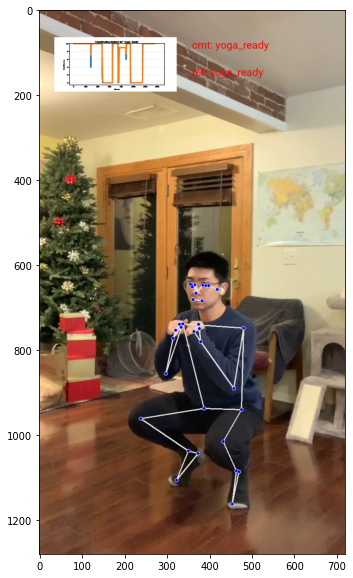

 89%|████████▉ | 1351/1520.0 [04:34<00:58,  2.88it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 89%|████████▉ | 1352/1520.0 [04:34<01:00,  2.78it/s]

start time 1646844760.0542572


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 89%|████████▉ | 1353/1520.0 [04:34<00:51,  3.25it/s]

start time 1646844760.2762532
start time 1646844760.469255


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 89%|████████▉ | 1354/1520.0 [04:35<00:46,  3.60it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 89%|████████▉ | 1355/1520.0 [04:35<00:41,  3.95it/s]

start time 1646844760.6812556
start time 1646844760.886254


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 89%|████████▉ | 1356/1520.0 [04:35<00:40,  4.04it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 89%|████████▉ | 1357/1520.0 [04:35<00:44,  3.67it/s]

start time 1646844761.1872563


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 89%|████████▉ | 1358/1520.0 [04:36<00:40,  3.99it/s]

start time 1646844761.4442546
start time 1646844761.631285


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 89%|████████▉ | 1359/1520.0 [04:36<00:37,  4.33it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 89%|████████▉ | 1360/1520.0 [04:36<00:36,  4.40it/s]

start time 1646844761.8452532


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 90%|████████▉ | 1361/1520.0 [04:36<00:39,  3.99it/s]

start time 1646844762.0982547


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 90%|████████▉ | 1362/1520.0 [04:37<00:41,  3.80it/s]

start time 1646844762.4452534
start time 1646844762.631286


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 90%|████████▉ | 1363/1520.0 [04:37<00:37,  4.18it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 90%|████████▉ | 1364/1520.0 [04:37<00:36,  4.32it/s]

start time 1646844762.8262537
start time 1646844763.0348003


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 90%|████████▉ | 1365/1520.0 [04:37<00:36,  4.24it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 90%|████████▉ | 1366/1520.0 [04:38<00:43,  3.52it/s]

start time 1646844763.4387689


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 90%|████████▉ | 1367/1520.0 [04:38<00:38,  3.92it/s]

start time 1646844763.6727684
start time 1646844763.8647678


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 90%|█████████ | 1368/1520.0 [04:38<00:36,  4.17it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844764.0827684


 90%|█████████ | 1369/1520.0 [04:38<00:44,  3.43it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 90%|█████████ | 1370/1520.0 [04:39<00:46,  3.26it/s]

start time 1646844764.5667696


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 90%|█████████ | 1371/1520.0 [04:39<00:41,  3.60it/s]

start time 1646844764.8357716
start time 1646844765.0437677


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 90%|█████████ | 1372/1520.0 [04:39<00:37,  3.91it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 90%|█████████ | 1373/1520.0 [04:39<00:35,  4.11it/s]

start time 1646844765.2603006
start time 1646844765.4423003


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 90%|█████████ | 1374/1520.0 [04:40<00:37,  3.93it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 90%|█████████ | 1375/1520.0 [04:40<00:39,  3.63it/s]

start time 1646844765.862302
start time 1646844766.0573306


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 91%|█████████ | 1376/1520.0 [04:40<00:36,  4.00it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 91%|█████████ | 1377/1520.0 [04:40<00:33,  4.30it/s]

start time 1646844766.2453306


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 91%|█████████ | 1378/1520.0 [04:41<00:31,  4.47it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 91%|█████████ | 1379/1520.0 [04:41<00:34,  4.11it/s]

start time 1646844766.4533012
start time 1646844766.677301


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 91%|█████████ | 1380/1520.0 [04:41<00:36,  3.83it/s]

start time 1646844767.0403004
start time 1646844767.2252996


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 91%|█████████ | 1381/1520.0 [04:41<00:33,  4.21it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 91%|█████████ | 1382/1520.0 [04:42<00:31,  4.41it/s]

start time 1646844767.417333


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 91%|█████████ | 1383/1520.0 [04:42<00:29,  4.58it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 91%|█████████ | 1384/1520.0 [04:42<00:33,  4.04it/s]

start time 1646844767.6253319
start time 1646844767.9263017


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 91%|█████████ | 1385/1520.0 [04:42<00:35,  3.79it/s]

start time 1646844768.2433305
start time 1646844768.427362


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 91%|█████████ | 1386/1520.0 [04:43<00:32,  4.16it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 91%|█████████▏| 1387/1520.0 [04:43<00:35,  3.75it/s]

start time 1646844768.6333306


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 91%|█████████▏| 1388/1520.0 [04:43<00:36,  3.58it/s]

start time 1646844769.02933


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 91%|█████████▏| 1389/1520.0 [04:44<00:36,  3.64it/s]

start time 1646844769.3299108
start time 1646844769.532913


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 91%|█████████▏| 1390/1520.0 [04:44<00:32,  3.96it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 92%|█████████▏| 1391/1520.0 [04:44<00:31,  4.16it/s]

start time 1646844769.7379143


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 92%|█████████▏| 1392/1520.0 [04:44<00:33,  3.81it/s]

start time 1646844769.9739132


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 92%|█████████▏| 1393/1520.0 [04:45<00:35,  3.54it/s]

start time 1646844770.381912
start time 1646844770.5749424


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 92%|█████████▏| 1394/1520.0 [04:45<00:32,  3.93it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 92%|█████████▏| 1395/1520.0 [04:45<00:29,  4.17it/s]

start time 1646844770.770912
start time 1646844770.981912


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 92%|█████████▏| 1396/1520.0 [04:45<00:29,  4.22it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 92%|█████████▏| 1397/1520.0 [04:46<00:33,  3.68it/s]

start time 1646844771.3469117


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 92%|█████████▏| 1398/1520.0 [04:46<00:30,  3.98it/s]

start time 1646844771.5689135
start time 1646844771.7559109


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 92%|█████████▏| 1399/1520.0 [04:46<00:28,  4.30it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 92%|█████████▏| 1400/1520.0 [04:46<00:27,  4.38it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844771.9739146
start time 1646844772.1529117


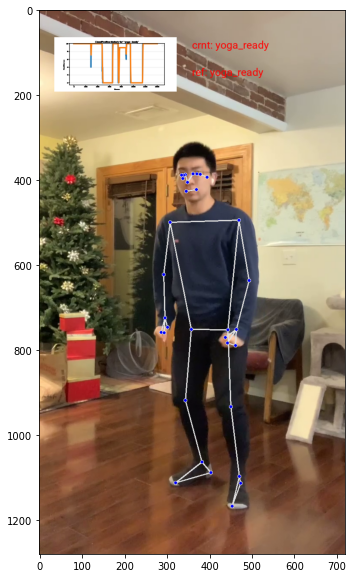

 92%|█████████▏| 1401/1520.0 [04:47<00:43,  2.75it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 92%|█████████▏| 1402/1520.0 [04:47<00:36,  3.21it/s]

start time 1646844772.8449426
start time 1646844773.0379114


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 92%|█████████▏| 1403/1520.0 [04:47<00:32,  3.59it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 92%|█████████▏| 1404/1520.0 [04:47<00:30,  3.84it/s]

start time 1646844773.2644427
start time 1646844773.4464414


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 92%|█████████▏| 1405/1520.0 [04:48<00:27,  4.23it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 92%|█████████▎| 1406/1520.0 [04:48<00:31,  3.63it/s]

start time 1646844773.6824424


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 93%|█████████▎| 1407/1520.0 [04:48<00:30,  3.76it/s]

start time 1646844774.0574427
start time 1646844774.2534673


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 93%|█████████▎| 1408/1520.0 [04:48<00:27,  4.05it/s]

start time 1646844774.4624422


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 93%|█████████▎| 1409/1520.0 [04:49<00:38,  2.85it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 93%|█████████▎| 1410/1520.0 [04:49<00:37,  2.91it/s]

start time 1646844775.1800475
start time 1646844775.3710496


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 93%|█████████▎| 1411/1520.0 [04:50<00:32,  3.35it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 93%|█████████▎| 1412/1520.0 [04:50<00:29,  3.66it/s]

start time 1646844775.5800474
start time 1646844775.7810476


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 93%|█████████▎| 1413/1520.0 [04:50<00:26,  3.97it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 93%|█████████▎| 1414/1520.0 [04:50<00:24,  4.35it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844775.979047
start time 1646844776.1530488


 93%|█████████▎| 1415/1520.0 [04:50<00:22,  4.68it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 93%|█████████▎| 1416/1520.0 [04:51<00:26,  3.95it/s]

start time 1646844776.4575589


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 93%|█████████▎| 1417/1520.0 [04:51<00:24,  4.18it/s]

start time 1646844776.6955914
start time 1646844776.8865583


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 93%|█████████▎| 1418/1520.0 [04:51<00:22,  4.44it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 93%|█████████▎| 1419/1520.0 [04:51<00:22,  4.56it/s]

start time 1646844777.0805576
start time 1646844777.2915576


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 93%|█████████▎| 1420/1520.0 [04:51<00:21,  4.69it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 93%|█████████▎| 1421/1520.0 [04:52<00:26,  3.76it/s]

start time 1646844777.6605597


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 94%|█████████▎| 1422/1520.0 [04:52<00:23,  4.10it/s]

start time 1646844777.8735576
start time 1646844778.0625894


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 94%|█████████▎| 1423/1520.0 [04:52<00:22,  4.39it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 94%|█████████▎| 1424/1520.0 [04:52<00:21,  4.38it/s]

start time 1646844778.278558


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844778.499559


 94%|█████████▍| 1425/1520.0 [04:53<00:26,  3.65it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 94%|█████████▍| 1426/1520.0 [04:53<00:27,  3.48it/s]

start time 1646844778.9905593
start time 1646844779.181589


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 94%|█████████▍| 1427/1520.0 [04:53<00:24,  3.87it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 94%|█████████▍| 1428/1520.0 [04:54<00:22,  4.10it/s]

start time 1646844779.3845592


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 94%|█████████▍| 1429/1520.0 [04:54<00:21,  4.25it/s]

start time 1646844779.6065576
start time 1646844779.7905884


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 94%|█████████▍| 1430/1520.0 [04:54<00:19,  4.52it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 94%|█████████▍| 1431/1520.0 [04:54<00:22,  3.88it/s]

start time 1646844780.0955582


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 94%|█████████▍| 1432/1520.0 [04:55<00:21,  4.02it/s]

start time 1646844780.3695595
start time 1646844780.5635583


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 94%|█████████▍| 1433/1520.0 [04:55<00:20,  4.29it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 94%|█████████▍| 1434/1520.0 [04:55<00:19,  4.37it/s]

start time 1646844780.7805882
start time 1646844780.9745896


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 94%|█████████▍| 1435/1520.0 [04:55<00:19,  4.28it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 94%|█████████▍| 1436/1520.0 [04:56<00:22,  3.72it/s]

start time 1646844781.355562


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 95%|█████████▍| 1437/1520.0 [04:56<00:21,  3.93it/s]

start time 1646844781.6020715
start time 1646844781.787071


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 95%|█████████▍| 1438/1520.0 [04:56<00:19,  4.25it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 95%|█████████▍| 1439/1520.0 [04:56<00:18,  4.37it/s]

start time 1646844782.0030727


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 95%|█████████▍| 1440/1520.0 [04:57<00:20,  3.96it/s]

start time 1646844782.2500713


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 95%|█████████▍| 1441/1520.0 [04:57<00:20,  3.91it/s]

start time 1646844782.5700707
start time 1646844782.7651024


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 95%|█████████▍| 1442/1520.0 [04:57<00:18,  4.18it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 95%|█████████▍| 1443/1520.0 [04:57<00:17,  4.35it/s]

start time 1646844782.9730725
start time 1646844783.17907


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 95%|█████████▌| 1444/1520.0 [04:57<00:16,  4.58it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844783.506071


 95%|█████████▌| 1445/1520.0 [04:58<00:23,  3.24it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 95%|█████████▌| 1446/1520.0 [04:58<00:20,  3.66it/s]

start time 1646844783.8860745
start time 1646844784.082071


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 95%|█████████▌| 1447/1520.0 [04:58<00:18,  3.92it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 95%|█████████▌| 1448/1520.0 [04:59<00:17,  4.12it/s]

start time 1646844784.31407


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 95%|█████████▌| 1449/1520.0 [04:59<00:19,  3.65it/s]

start time 1646844784.5890715


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 95%|█████████▌| 1450/1520.0 [04:59<00:18,  3.69it/s]

start time 1646844784.920072
start time 1646844785.1110704


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


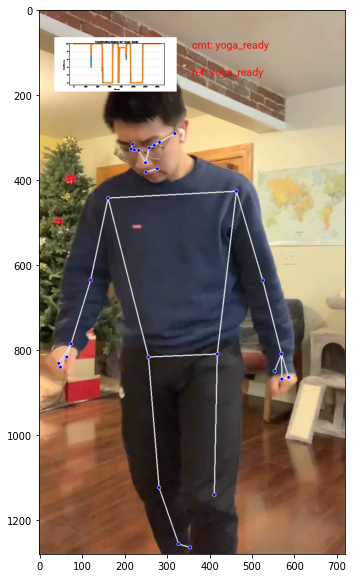

 95%|█████████▌| 1451/1520.0 [05:00<00:22,  3.01it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 96%|█████████▌| 1452/1520.0 [05:00<00:24,  2.78it/s]

start time 1646844785.7605793


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 96%|█████████▌| 1453/1520.0 [05:00<00:21,  3.12it/s]

start time 1646844786.0506356
start time 1646844786.2356355


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 96%|█████████▌| 1454/1520.0 [05:00<00:18,  3.57it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 96%|█████████▌| 1455/1520.0 [05:01<00:16,  3.83it/s]

start time 1646844786.450635
start time 1646844786.6346684


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 96%|█████████▌| 1456/1520.0 [05:01<00:15,  4.22it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 96%|█████████▌| 1457/1520.0 [05:01<00:15,  3.97it/s]

start time 1646844786.888637


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 96%|█████████▌| 1458/1520.0 [05:01<00:16,  3.83it/s]

start time 1646844787.200147
start time 1646844787.3881485


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 96%|█████████▌| 1459/1520.0 [05:02<00:14,  4.18it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 96%|█████████▌| 1460/1520.0 [05:02<00:13,  4.34it/s]

start time 1646844787.5931492


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 96%|█████████▌| 1461/1520.0 [05:02<00:14,  4.00it/s]

start time 1646844787.829152


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 96%|█████████▌| 1462/1520.0 [05:02<00:15,  3.82it/s]

start time 1646844788.1791782
start time 1646844788.3731468


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 96%|█████████▋| 1463/1520.0 [05:03<00:13,  4.18it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 96%|█████████▋| 1464/1520.0 [05:03<00:12,  4.43it/s]

start time 1646844788.5611794


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 96%|█████████▋| 1465/1520.0 [05:03<00:12,  4.48it/s]

start time 1646844788.7811475


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844789.0556881


 96%|█████████▋| 1466/1520.0 [05:03<00:14,  3.69it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 97%|█████████▋| 1467/1520.0 [05:04<00:13,  3.79it/s]

start time 1646844789.4148223


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 97%|█████████▋| 1468/1520.0 [05:04<00:12,  4.09it/s]

start time 1646844789.611846


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844789.8318224


 97%|█████████▋| 1469/1520.0 [05:04<00:15,  3.30it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 97%|█████████▋| 1470/1520.0 [05:05<00:15,  3.20it/s]

start time 1646844790.306825


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 97%|█████████▋| 1471/1520.0 [05:05<00:13,  3.53it/s]

start time 1646844790.6028554
start time 1646844790.790822


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 97%|█████████▋| 1472/1520.0 [05:05<00:12,  3.90it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 97%|█████████▋| 1473/1520.0 [05:05<00:11,  4.07it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844791.0158224
start time 1646844791.1968534


 97%|█████████▋| 1474/1520.0 [05:05<00:11,  3.97it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 97%|█████████▋| 1475/1520.0 [05:06<00:13,  3.43it/s]

start time 1646844791.644337


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 97%|█████████▋| 1476/1520.0 [05:06<00:11,  3.83it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 97%|█████████▋| 1477/1520.0 [05:06<00:10,  4.11it/s]

start time 1646844791.856372
start time 1646844792.0474048
start time 1646844792.254373


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 97%|█████████▋| 1478/1520.0 [05:06<00:09,  4.37it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 97%|█████████▋| 1479/1520.0 [05:07<00:11,  3.71it/s]

start time 1646844792.539372


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 97%|█████████▋| 1480/1520.0 [05:07<00:10,  3.78it/s]

start time 1646844792.8664026
start time 1646844793.0594347


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 97%|█████████▋| 1481/1520.0 [05:07<00:09,  4.14it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 98%|█████████▊| 1482/1520.0 [05:07<00:08,  4.30it/s]

start time 1646844793.265402
start time 1646844793.4594023


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 98%|█████████▊| 1483/1520.0 [05:08<00:09,  3.95it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 98%|█████████▊| 1484/1520.0 [05:08<00:09,  3.70it/s]

start time 1646844793.8524055


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 98%|█████████▊| 1485/1520.0 [05:08<00:08,  4.05it/s]

start time 1646844794.0734034
start time 1646844794.2674022


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 98%|█████████▊| 1486/1520.0 [05:08<00:07,  4.29it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 98%|█████████▊| 1487/1520.0 [05:09<00:08,  3.97it/s]

start time 1646844794.4854043


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 98%|█████████▊| 1488/1520.0 [05:09<00:09,  3.37it/s]

start time 1646844794.8774025


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 98%|█████████▊| 1489/1520.0 [05:09<00:08,  3.60it/s]

start time 1646844795.2084029
start time 1646844795.3974323


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 98%|█████████▊| 1490/1520.0 [05:10<00:07,  3.97it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 98%|█████████▊| 1491/1520.0 [05:10<00:07,  4.13it/s]

start time 1646844795.615434


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844795.8374033


 98%|█████████▊| 1492/1520.0 [05:10<00:07,  3.74it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 98%|█████████▊| 1493/1520.0 [05:10<00:07,  3.63it/s]

start time 1646844796.2384021
start time

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 98%|█████████▊| 1494/1520.0 [05:11<00:06,  4.02it/s]

 1646844796.422435
start time 1646844796.6174016


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 98%|█████████▊| 1495/1520.0 [05:11<00:05,  4.26it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 98%|█████████▊| 1496/1520.0 [05:11<00:05,  4.33it/s]

start time 1646844796.815403


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 98%|█████████▊| 1497/1520.0 [05:11<00:06,  3.63it/s]

start time 1646844797.1995206


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 99%|█████████▊| 1498/1520.0 [05:12<00:05,  3.99it/s]

start time 1646844797.4205542
start time 1646844797.6165192


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 99%|█████████▊| 1499/1520.0 [05:12<00:04,  4.22it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 99%|█████████▊| 1500/1520.0 [05:12<00:04,  4.38it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


start time 1646844797.83252
start time 1646844798.0115194


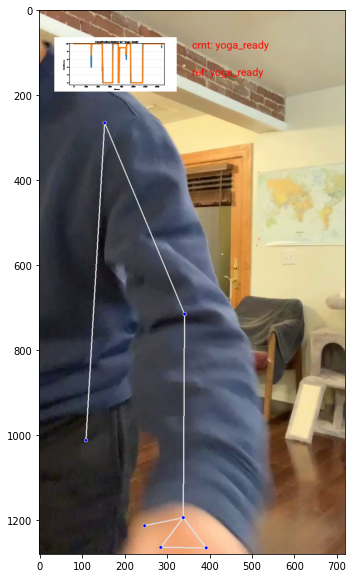

 99%|█████████▉| 1501/1520.0 [05:13<00:06,  2.89it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 99%|█████████▉| 1502/1520.0 [05:13<00:05,  3.35it/s]

start time 1646844798.6420345
start time 1646844798.832036


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 99%|█████████▉| 1503/1520.0 [05:13<00:04,  3.71it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 99%|█████████▉| 1504/1520.0 [05:13<00:04,  3.74it/s]

start time 1646844799.1015468
start time 1646844799.2885458


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 99%|█████████▉| 1505/1520.0 [05:13<00:03,  4.07it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 99%|█████████▉| 1506/1520.0 [05:14<00:04,  3.32it/s]

start time 1646844799.6675484


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 99%|█████████▉| 1507/1520.0 [05:14<00:03,  3.55it/s]

start time 1646844799.9605458


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 99%|█████████▉| 1508/1520.0 [05:14<00:03,  3.85it/s]

start time 1646844800.1735466
start time 1646844800.4085462


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 99%|█████████▉| 1509/1520.0 [05:15<00:03,  3.22it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 99%|█████████▉| 1510/1520.0 [05:15<00:03,  3.04it/s]

start time 1646844800.9525492
start time

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 99%|█████████▉| 1511/1520.0 [05:15<00:02,  3.47it/s]

 1646844801.168547


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 99%|█████████▉| 1512/1520.0 [05:16<00:02,  3.77it/s]

start time 1646844801.375548


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
100%|█████████▉| 1513/1520.0 [05:16<00:01,  3.69it/s]

start time 1646844801.6505468


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
100%|█████████▉| 1514/1520.0 [05:16<00:01,  3.59it/s]

start time 1646844801.8785465


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
100%|█████████▉| 1515/1520.0 [05:16<00:01,  3.39it/s]

start time 1646844802.2775471
start time 1646844802.48258


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
100%|█████████▉| 1516/1520.0 [05:17<00:01,  3.81it/s]No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
100%|█████████▉| 1517/1520.0 [05:17<00:00,  4.10it/s]

start time 1646844802.670577


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
100%|█████████▉| 1518/1520.0 [05:17<00:00,  4.07it/s]

start time 1646844802.900549


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
100%|█████████▉| 1519/1520.0 [05:17<00:00,  3.73it/s]

start time 1646844803.2235475


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
100%|██████████| 1520/1520.0 [05:18<00:00,  4.78it/s]

start time 1646844803.4615488


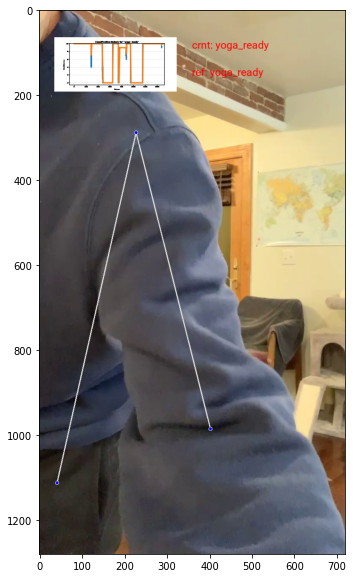

In [70]:
# Run classification on a video.
import os
import tqdm

from mediapipe.python.solutions import drawing_utils as mp_drawing


# Open output video.
out_video = cv2.VideoWriter(out_video_path, cv2.VideoWriter_fourcc(
    *'mp4v'), video_fps, (video_width, video_height))

frame_idx = 0
output_frame = None
with tqdm.tqdm(total=video_n_frames, position=0, leave=True) as pbar:
    while True:
        # Get next frame of the video.
        success, input_frame = video_cap.read()
        if not success:
            break

        # Run pose tracker.
        input_frame = cv2.cvtColor(input_frame, cv2.COLOR_BGR2RGB)
        result = pose_tracker.process(image=input_frame)
        pose_landmarks = result.pose_landmarks

        # Draw pose prediction.
        output_frame = input_frame.copy()
        if pose_landmarks is not None:
            mp_drawing.draw_landmarks(
                image=output_frame,
                landmark_list=pose_landmarks,
                connections=mp_pose.POSE_CONNECTIONS)

        if pose_landmarks is not None:
            # Get landmarks.
            frame_height, frame_width = output_frame.shape[0], output_frame.shape[1]
            pose_landmarks = np.array([[lmk.x * frame_width, lmk.y * frame_height, lmk.z * frame_width]
                                       for lmk in pose_landmarks.landmark], dtype=np.float32)
            assert pose_landmarks.shape == (
                33, 3), 'Unexpected landmarks shape: {}'.format(pose_landmarks.shape)

            # Classify the pose on the current frame.
            pose_classification = pose_classifier(pose_landmarks)

            # Smooth classification using EMA.
            pose_classification_filtered = pose_classification_filter(
                pose_classification)

            # Count repetitions.
            # repetitions_count = repetition_counter(pose_classification_filtered)

            succ = pose_checker(pose_classification_filtered)
            if succ:
                if class_idx < len(class_names):
                  class_idx += 1
                

                pose_checker = PoseChecker(
                    class_name=class_names[class_idx],
                    enter_threshold=8,
                    exit_threshold=6
                )

                # Initialize renderer.
                pose_classification_visualizer = PoseClassificationVisualizer(
                    class_name=class_names[class_idx],
                    plot_x_max=video_n_frames,
                    plot_y_max=10
                )
        else:
            # No pose => no classification on current frame.
            pose_classification = None

            # Still add empty classification to the filter to maintaing correct
            # smoothing for future frames.
            pose_classification_filtered = pose_classification_filter(dict())
            pose_classification_filtered = None

            # Don't update the counter presuming that person is 'frozen'. Just
            # take the latest repetitions count.
            # repetitions_count = repetition_counter.n_repeats

        # Draw classification plot and repetition counter.
        output_frame = pose_classification_visualizer(
            frame=output_frame,
            pose_classification=pose_classification,
            pose_classification_filtered=pose_classification_filtered,
            ref_pose=class_names[class_idx])

        # Save the output frame.
        out_video.write(cv2.cvtColor(
            np.array(output_frame), cv2.COLOR_RGB2BGR))

        # Show intermediate frames of the video to track progress.
        if frame_idx % 50 == 0:
            show_image(output_frame)

        frame_idx += 1
        pbar.update()

# Close output video.
out_video.release()

# Release MediaPipe resources.
pose_tracker.close()

# Show the last frame of the video.
if output_frame is not None:
    show_image(output_frame)
